In [146]:
import os
import sys
import time
import warnings
import numpy as np
import pandas as pd
import tensorflow as tf
import keras
import keras.backend as K
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
from keras.optimizers import SGD, Adam
from keras.models import Sequential
from keras.regularizers import l1_l2
from sklearn.metrics import accuracy_score
from collections import OrderedDict, Counter
from tensorflow.python.ops import gen_array_ops
from keras.layers import Dense, Dropout, Flatten
from names import Names as n

In [315]:
from descartes import PolygonPatch
import alphashape
from sklearn.cluster import KMeans

In [3]:
from pathlib import Path
from harness.test_harness_class import TestHarness
from harness.th_model_instances.hamed_models.random_forest_classification import random_forest_classification
from harness.th_model_instances.hamed_models.weighted_logistic import weighted_logistic_classifier

In [4]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 10000)
pd.set_option('display.max_colwidth', None)
matplotlib.use("tkagg")
%matplotlib inline
warnings.filterwarnings('ignore')

In [5]:
col_idx = OrderedDict([(n.label, 0), ("inducer_concentration", 1), ("timepoint", 2), ("percent_live", 3)])

# Read in Data and Prepare Variables

In [6]:
strateos_sample = pd.read_csv("final_strateos_sample.csv")
duke_sample = pd.read_csv("final_duke_sample.csv")
combo_sample = pd.read_csv("final_combo_sample.csv")

In [7]:
combo_sample.drop(columns=[x for x in combo_sample.columns if 
                           (("BL" in x) or ("YL2" in x) or ("YL3" in x) or ("YL4" in x))], inplace=True)
combo_sample["YL1-A"].fillna(combo_sample["RL1-A"], inplace=True)
combo_sample["YL1-H"].fillna(combo_sample["RL1-H"], inplace=True)
combo_sample["YL1-W"].fillna(combo_sample["RL1-W"], inplace=True)
combo_sample.drop(columns=[x for x in combo_sample.columns if "RL1" in x], inplace=True)
combo_sample.rename(columns={"YL1-A":"(Y/R)L1-A",
                             "YL1-H":"(Y/R)L1-H",
                             "YL1-W":"(Y/R)L1-W"}, inplace=True)

In [8]:
strateos_stained = strateos_sample.loc[strateos_sample["stain"] == 1]
strateos_unstained = strateos_sample.loc[strateos_sample["stain"] == 0]

duke_stained = duke_sample.loc[duke_sample["stain"] == 1]
duke_unstained = duke_sample.loc[duke_sample["stain"] == 0]

combo_stained = combo_sample.loc[combo_sample["stain"] == 1]
combo_unstained = combo_sample.loc[combo_sample["stain"] == 0]

In [9]:
features_unstained = n.morph_cols
features_stained_strateos = n.morph_cols + ["RL1-A", "RL1-H", "RL1-W"]
features_stained_duke = n.morph_cols + ["YL1-A", "YL1-H", "YL1-W"]
features_stained_combo = n.morph_cols + ["(Y/R)L1-A", "(Y/R)L1-H", "(Y/R)L1-W"]

In [10]:
print(features_unstained)
print(features_stained_strateos)
print(features_stained_duke)
print(features_stained_combo)

['FSC-A', 'FSC-H', 'FSC-W', 'SSC-A', 'SSC-H', 'SSC-W']
['FSC-A', 'FSC-H', 'FSC-W', 'SSC-A', 'SSC-H', 'SSC-W', 'RL1-A', 'RL1-H', 'RL1-W']
['FSC-A', 'FSC-H', 'FSC-W', 'SSC-A', 'SSC-H', 'SSC-W', 'YL1-A', 'YL1-H', 'YL1-W']
['FSC-A', 'FSC-H', 'FSC-W', 'SSC-A', 'SSC-H', 'SSC-W', '(Y/R)L1-A', '(Y/R)L1-H', '(Y/R)L1-W']


In [11]:
strateos_stained

,stain,inducer_concentration,timepoint,FSC-A,FSC-H,FSC-W,SSC-A,SSC-H,SSC-W,RL1-A,RL1-H,RL1-W,BL1-A,BL1-H,BL1-W,percent_live,source
300000,1,0.0,0.5,5.240724,4.843488,1.944483,5.095954,4.765475,1.869232,2.694605,2.278754,0.0,2.311754,1.838849,0.0,39.67,strateos
300001,1,0.0,0.5,4.943989,4.859727,1.612784,4.706598,4.634185,1.518514,0.000000,2.012837,0.0,1.531479,1.845098,0.0,39.67,strateos
300002,1,0.0,0.5,5.292560,4.903025,1.934498,5.257590,5.057571,1.897627,2.271842,2.397940,0.0,0.000000,1.982271,0.0,39.67,strateos
300003,1,0.0,0.5,4.787963,4.759456,1.568202,4.835500,4.742183,1.591065,1.176091,2.155336,0.0,0.000000,1.477121,0.0,39.67,strateos
300004,1,0.0,0.5,5.153077,5.001193,1.672098,5.060547,4.921265,1.643453,2.404834,2.340444,0.0,1.799341,1.949390,0.0,39.67,strateos
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
599995,1,80.0,6.0,3.457125,3.337858,0.000000,2.667453,2.632457,0.000000,2.155336,2.505150,0.0,1.447158,1.875061,0.0,0.00,strateos
599996,1,80.0,6.0,3.677789,3.425534,0.000000,3.223236,2.996074,0.000000,1.716003,2.184691,0.0,1.568202,1.949390,0.0,0.00,strateos
599997,1,80.0,6.0,3.611723,3.410777,0.000000,2.611723,2.928396,0.000000,0.000000,1.838849,0.0,0.000000,1.544068,0.0,0.00,strateos
599998,1,80.0,6.0,4.384067,3.602386,0.000000,0.000000,2.320146,0.000000,0.000000,1.973128,0.0,0.000000,1.653213,0.0,0.00,strateos


# Model Functions

In [12]:
def training_progress(fitted_model, metrics, num_plots, loss_name, plot_val=None):
    '''
    A function for plotting the model history by showing the metric and loss throughout training
    '''
    plt.subplot(1, num_plots, 2)
    plt.plot(fitted_model.history['loss'], label='train loss')
    if plot_val is not None:
        plt.plot(fitted_model.history['val_loss'], label='val loss')
    plt.title('Loss ({})'.format(loss_name))
#     plt.legend()

    for i, metric in enumerate(metrics):
        subplot_number = i + 3
        plt.subplot(1, num_plots, subplot_number)
        plt.plot(fitted_model.history[metric], label=str(metric))
        if plot_val is not None:
            plt.plot(fitted_model.history[f'val_{metric}'], label=f'val_{metric}')
        plt.title(str(metric))
#         plt.legend()

    plt.show()


def plot_model_result(model, fitted_model, metrics, X, loss_name, plot_val=None):
    '''
    plot the foe_probabilities of a model
    plot the training history
    show training accuracy
    '''
    num_plots = len(metrics) + 2
    probas = model.predict_proba(X)
    plt.figure(figsize=(15, 5))
    plt.subplot(1, num_plots, 1)
    plt.hist(probas)
    plt.xlabel('predict_proba')
    training_progress(fitted_model, metrics, num_plots, loss_name, plot_val)

In [13]:
def bin_cross(label_conds_cfus, y_pred):
    y_pred = K.flatten(y_pred)
    y_true = label_conds_cfus[:, col_idx[n.label]]
    final_loss = tf.losses.binary_crossentropy(y_true=y_true, y_pred=y_pred)
    return final_loss

def cfu_loss(label_conds_cfus, y_pred):
    cfu_percent_live = label_conds_cfus[:, col_idx["percent_live"]]
    cfu_percent_live = cfu_percent_live / 100.0
    condition_indices = [col_idx["inducer_concentration"], col_idx["timepoint"]]
    conditions = tf.gather(label_conds_cfus, condition_indices, axis=1)
    y_pred = K.flatten(y_pred)
    y_pred = tf.sigmoid((y_pred - 0.5) * 100)
    uniques, idx, count = gen_array_ops.unique_with_counts_v2(conditions, [0])
    num_unique = tf.size(count)
    pred_percents = tf.math.unsorted_segment_mean(data=y_pred, segment_ids=idx, num_segments=num_unique)
    cfu_percents = tf.math.unsorted_segment_mean(data=cfu_percent_live, segment_ids=idx, num_segments=num_unique)
    diff = tf.math.subtract(pred_percents, cfu_percents)
    abs_diff = K.abs(diff)
    abs_diff_mean = tf.math.reduce_mean(abs_diff)
    return abs_diff_mean

def joint_loss_wrapper(cfu_loss_weight):
    
    def joint_loss(label_conds_cfus, y_pred):
        loss_bin_cross = bin_cross(label_conds_cfus=label_conds_cfus, y_pred=y_pred)
        loss_cfu = cfu_loss(label_conds_cfus=label_conds_cfus, y_pred=y_pred)
        return loss_bin_cross + cfu_loss_weight*loss_cfu
    
    return joint_loss

In [14]:
def booster_model_v2(input_shape=None, loss=joint_loss_wrapper(2), metrics=None, lr=0.1):
    if metrics is None:
        metrics = [loss]
    
    model = Sequential()
    model.add(Dense(units=32, activation="relu", input_shape=(input_shape,)))
    model.add(Dropout(0.1))
    model.add(Dense(units=16, activation="relu"))
    model.add(Dropout(0.1))
    model.add(Dense(units=8, activation="relu"))
    model.add(Dropout(0.1))
    model.add(Dense(units=1, activation='sigmoid'))
    model.compile(loss=loss, optimizer=Adam(lr=lr),
                  metrics=metrics, run_eagerly=True)
    return model

In [15]:
def run_model(model_function, lr, loss, metrics, X, Y, epochs, batch_size, verbose, shuffle, plot_type="scatter"):
    # reset model each time
    tf.compat.v1.reset_default_graph
    tf.keras.backend.clear_session()
    
    # create model
    model = model_function(input_shape=len(X.columns), loss=loss, metrics=metrics, lr=lr)
#     print(model.summary())
    
    # fit model and predict
    start_time = time.time()
    fitted_model = model.fit(X, Y, epochs=epochs, batch_size=batch_size, verbose=verbose, shuffle=shuffle)
    predict_proba = model.predict(X)
    class_predictions = np.ndarray.flatten(predict_proba > 0.5).astype("int32")
    
    # print metrics
    training_accuracy = accuracy_score(y_true=Y[n.label], y_pred=class_predictions)
    print("\nModel Boosting took {} seconds".format(time.time() - start_time))
    print("Training Accuracy = {}%".format(round(100 * training_accuracy, 2)))
    print(Counter(class_predictions))
    
    # plot probabilities and losses
    plot_model_result(model=model, fitted_model=fitted_model,
                      metrics=[x.__name__ for x in metrics],
                      X=X, loss_name=loss.__name__, plot_val=None)
    
    # print summary of predictions vs. cfus
    preds_and_labels = Y.copy()
    preds_and_labels[n.label] = preds_and_labels[n.label] * 100
    preds_and_labels["nn_preds"] = class_predictions * 100
    preds_and_labels.rename(columns={"percent_live":"cfu_percent_live"}, inplace=True)
    groupby_means = preds_and_labels.groupby([n.inducer_concentration, n.timepoint]).mean()
    # print(groupby_means)
    
    condition_results = groupby_means.reset_index()
        
    # plot percent live over conditions
#     plot_percent_live_over_conditions(condition_results, plot_type)

    return condition_results, preds_and_labels

# Plotting Functions

In [16]:
def plot_percent_live_over_conditions(condition_results, plot_type="scatter", 
                                      color_by=n.inducer_concentration, fig_height=10,
                                      title=""):
    percent_live_df = condition_results
    
    plt.figure(figsize=(15, fig_height))
    sns.set(style="ticks", font_scale=2.0, rc={"lines.linewidth": 3.0})
    color_levels = list(percent_live_df[color_by].unique())
    color_levels.sort()
    num_colors = len(color_levels)
    palette = dict(zip(color_levels, sns.color_palette("bright", num_colors)))
    
    if plot_type == "line":
#         labels = sns.lineplot(x=percent_live_df[n.timepoint], y=percent_live_df[n.label],
#                       hue=percent_live_df[color_by], 
#                       palette=palette, legend=False, zorder=1, style=True, dashes=[(2,2)])

        preds = sns.lineplot(x=percent_live_df[n.timepoint], y=percent_live_df["nn_preds"],
                          hue=percent_live_df[color_by], 
                          palette=palette, legend="full", zorder=1)
        
        cfus = sns.scatterplot(x=percent_live_df[n.timepoint], y=percent_live_df["cfu_percent_live"],
                   hue=percent_live_df[color_by], 
                   palette=palette, legend=False, zorder=1, s=250, marker="o")

    elif plot_type == "scatter":
        labels = sns.scatterplot(x=percent_live_df[n.timepoint]-0.14, y=percent_live_df[n.label],
                                 hue=percent_live_df[color_by], 
                                 palette=palette, legend="full", zorder=1, s=250, marker="s")

        preds = sns.scatterplot(x=percent_live_df[n.timepoint], y=percent_live_df["nn_preds"],
                                hue=percent_live_df[color_by], 
                                palette=palette, legend=False, zorder=1, s=250, marker="^")
        
        cfus = sns.scatterplot(x=percent_live_df[n.timepoint]+0.14, y=percent_live_df["cfu_percent_live"],
                           hue=percent_live_df[color_by], 
                           palette=palette, legend=False, zorder=1, s=250, marker="o")
        plt.title("Square = Label Percent Live\nTriangle = Predicted Percent Live\nCircle = CFU Percent Live")

    
    elif plot_type == "mixed":
        labels = sns.scatterplot(x=percent_live_df[n.timepoint]-0.01, y=percent_live_df[n.label],
                                 hue=percent_live_df[color_by], 
                                 palette=palette, legend=False, zorder=1, s=250, marker="s")

        preds = sns.lineplot(x=percent_live_df[n.timepoint], y=percent_live_df["nn_preds"],
#                                 hue=percent_live_df[color_by], 
                                palette=palette, legend=False, zorder=1)
        
        cfus = sns.scatterplot(x=percent_live_df[n.timepoint]+0.01, y=percent_live_df["cfu_percent_live"],
                           hue=percent_live_df[color_by], 
                           palette=palette, legend=False, zorder=1, s=250, marker="o")
        plt.title(title, fontweight="bold")
        plt.xlabel("Exposure Time")
        plt.ylabel("Percent Live")



    # visual settings
    plt.xlim(0, 6.5)
    plt.ylim(-5, 105)
#     legend = plt.legend(bbox_to_anchor=(1.01, 0.9), loc=2, borderaxespad=0.,
#                         handlelength=4, markerscale=1.8)
#     legend.get_frame().set_edgecolor('black')

In [17]:
def plot_per_cond(condition_results):
    for conc in condition_results[n.inducer_concentration].unique():
        temp = condition_results.loc[condition_results[n.inducer_concentration] == conc]
        plot_percent_live_over_conditions(temp, plot_type="mixed", color_by=n.timepoint, fig_height=5,
                                          title="Ethanol Concentration = {}".format(conc))

In [18]:
def plot_prob_changes(concat, y_max):
    zero_to_zero = concat.loc[concat["change_type"]=="Remained Dead", "label_probs"]
    one_to_one = concat.loc[concat["change_type"]=="Remained Live", "label_probs"]
    zero_to_one = concat.loc[concat["change_type"]=="Changed from Dead to Live", "label_probs"]
    one_to_zero = concat.loc[concat["change_type"]=="Changed from Live to Dead", "label_probs"]

    plt.figure(figsize=(10,10))
    sns.distplot(zero_to_zero, bins=100, label="Remained Dead")
    sns.distplot(zero_to_one, bins=100, label="Changed from Dead to Live")
    sns.distplot(one_to_zero, bins=100, label="Changed from Live to Dead")
    sns.distplot(one_to_one, bins=100, label="Remained Live")

    plt.legend()
    plt.ylim(0, y_max)
    legend = plt.legend(bbox_to_anchor=(1.01, 0.9), loc=2, borderaxespad=0.,
                        handlelength=4, markerscale=1.8)
    legend.get_frame().set_edgecolor('black')
    
    
def get_all_run_info(df, X, pl, append_df_cols=None):
    if append_df_cols is not None:
        X = pd.concat([X, df[append_df_cols]], axis=1)
    concat = pd.concat([X, pl], axis=1)
    concat["nn_preds"] = concat["nn_preds"]/100
    concat[n.label] = concat[n.label]/100
    concat["changed"] = ~(concat["label"] == concat["nn_preds"])
    concat["change_type"] = "this_should_be_gone"
    concat.loc[(concat["label"] == 0) & (concat["nn_preds"] == 0), "change_type"] = "Remained Dead"
    concat.loc[(concat["label"] == 1) & (concat["nn_preds"] == 1), "change_type"] = "Remained Live"
    concat.loc[(concat["label"] == 0) & (concat["nn_preds"] == 1), "change_type"] = "Changed from Dead to Live"
    concat.loc[(concat["label"] == 1) & (concat["nn_preds"] == 0), "change_type"] = "Changed from Live to Dead"
    concat['nn_percent_live'] = concat.groupby([n.inducer_concentration, 
                                                n.timepoint])["nn_preds"].transform('mean') * 100
    concat["label_probs"] = df["label_probs"]
    
    return concat

# Create Labels for each DataFrame via Random Forest Models

In [19]:
def generate_rf_labels(data_df, features):
    df = data_df.copy()
    df["arbitrary_index"] = df.index
    defined_labels_df = df.loc[df[n.timepoint] == 6.0].copy()
    defined_labels_df = defined_labels_df.loc[defined_labels_df[n.inducer_concentration].isin([0.0, 20.0, 80.0])]
    defined_labels_df.loc[defined_labels_df[n.inducer_concentration]==0.0, "label"] = 1.0
    defined_labels_df.loc[defined_labels_df[n.inducer_concentration]==20.0, "label"] = 0.0
    defined_labels_df.loc[defined_labels_df[n.inducer_concentration]==80.0, "label"] = 0.0
    
    
    th = TestHarness(output_location=Path("__file__"))
    th.run_custom(function_that_returns_TH_model=random_forest_classification,
                  dict_of_function_parameters={},
                  training_data=defined_labels_df,
                  testing_data=defined_labels_df,
                  description="asdf",
                  target_cols=n.label,
                  feature_cols_to_use=features,
                  index_cols=["arbitrary_index"],
                  normalize=False,
                  feature_cols_to_normalize=features,
                  feature_extraction=False,
                  predict_untested_data=df)
    
    
    run_id = th.list_of_this_instance_run_ids[-1]
    labeled_df = pd.read_csv("__file__/test_harness_results/runs/run_{}/predicted_data.csv".format(run_id))
    
    df = pd.merge(df, labeled_df, on="arbitrary_index", how="left")
    df.rename(columns={"label_predictions":n.label, "label_prob_predictions":"label_probs"}, inplace=True)
    
    X = df[features]
    Y = df[col_idx.keys()]
    
    return df, X, Y

In [20]:
def generate_rf_labels_from_conditions(data_df, features,
                                       live_conditions=None, dead_conditions=None):
    df = data_df.copy()
    df["arbitrary_index"] = df.index
    
    if live_conditions is None:
        live_conditions = [{n.inducer_concentration: 0.0, n.timepoint: 6.0}]
    if dead_conditions is None:
        dead_conditions = [{n.inducer_concentration: 20.0, n.timepoint: 6.0},
                           {n.inducer_concentration: 80.0, n.timepoint: 6.0}]
    print("Conditions designated as Live: {}".format(live_conditions))
    print("Conditions designated as Dead: {}".format(dead_conditions))
    print()
    
    
    # Label points according to live_conditions and dead_conditions
    # first obtain indexes of the rows that correspond to live_conditions and dead_conditions
    live_indexes = []
    dead_indexes = []
    for lc in live_conditions:
        live_indexes += list(df.loc[(df[list(lc)] == pd.Series(lc)).all(axis=1), n.index])
    for dc in dead_conditions:
        dead_indexes += list(df.loc[(df[list(dc)] == pd.Series(dc)).all(axis=1), n.index])
    labeled_indexes = live_indexes + dead_indexes

    # TODO: check if this should call .copy() or not
    labeled_df = df[df[n.index].isin(labeled_indexes)]
    labeled_df.loc[labeled_df[n.index].isin(live_indexes), n.label] = 1
    labeled_df.loc[labeled_df[n.index].isin(dead_indexes), n.label] = 0    
    
    th = TestHarness(output_location=Path("__file__"))
    th.run_custom(function_that_returns_TH_model=random_forest_classification,
                  dict_of_function_parameters={},
                  training_data=labeled_df,
                  testing_data=labeled_df,
                  description="asdf",
                  target_cols=n.label,
                  feature_cols_to_use=features,
                  index_cols=["arbitrary_index"],
                  normalize=False,
                  feature_cols_to_normalize=features,
                  feature_extraction=False,
                  predict_untested_data=df)
    
    
    run_id = th.list_of_this_instance_run_ids[-1]
    labeled_df = pd.read_csv("__file__/test_harness_results/runs/run_{}/predicted_data.csv".format(run_id))
    
    df = pd.merge(df, labeled_df, on="arbitrary_index", how="left")
    df.rename(columns={"label_predictions":n.label, "label_prob_predictions":"label_probs"}, inplace=True)
    
    X = df[features]
    Y = df[col_idx.keys()]
    
    return df, X, Y

In [ ]:
df_strateos_unstained, X_strateos_unstained, Y_strateos_unstained = generate_rf_labels(
                                                                    strateos_unstained, 
                                                                    features_unstained)

In [ ]:
df_strateos_stained, X_strateos_stained, Y_strateos_stained = generate_rf_labels(
                                                              strateos_stained, 
                                                              features_stained_strateos)

In [21]:
df_strateos_stained_morph, \
X_strateos_stained_morph, \
Y_strateos_stained_morph = generate_rf_labels_from_conditions(strateos_stained,
                                                              features_unstained,
                                                              )

Conditions designated as Live: [{'inducer_concentration': 0.0, 'timepoint': 6.0}]
Conditions designated as Dead: [{'inducer_concentration': 20.0, 'timepoint': 6.0}, {'inducer_concentration': 80.0, 'timepoint': 6.0}]


----------------------------------------------------------------------------------------------------
Starting run of model random_forest_classification at time 06:46:53
Starting Classification training...
Training time was: 2.03 seconds
Testing time was: 0.44 seconds
Prediction time of untested data was: 4.591526985168457
Run finished at 06:47:02. Total run time = 8.77 seconds
^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^




In [ ]:
df_strateos_stained_morph, \
X_strateos_stained_morph, \
Y_strateos_stained_morph = generate_rf_labels_from_conditions(strateos_stained,
                                                              features_unstained,
                                                live_conditions=[{n.inducer_concentration: 0.0, n.timepoint: 0.5},
                                                                 {n.inducer_concentration: 0.0, n.timepoint: 1.0},
                                                                 {n.inducer_concentration: 0.0, n.timepoint: 1.5},
                                                                 {n.inducer_concentration: 0.0, n.timepoint: 2.0},
                                                                 {n.inducer_concentration: 0.0, n.timepoint: 2.5},
                                                                 {n.inducer_concentration: 0.0, n.timepoint: 3.0},
                                                                 {n.inducer_concentration: 0.0, n.timepoint: 3.5},
                                                                 {n.inducer_concentration: 0.0, n.timepoint: 4.0},
                                                                 {n.inducer_concentration: 0.0, n.timepoint: 4.5},
                                                                 {n.inducer_concentration: 0.0, n.timepoint: 5.0},
                                                                 {n.inducer_concentration: 0.0, n.timepoint: 5.5},
                                                                 {n.inducer_concentration: 0.0, n.timepoint: 6.0}],
                                                              
                                                dead_conditions=[{n.inducer_concentration: 10.0, n.timepoint: 6.0},
                                                                 {n.inducer_concentration: 15.0, n.timepoint: 5.5},
                                                                 {n.inducer_concentration: 15.0, n.timepoint: 6.0},
                                                                 {n.inducer_concentration: 20.0, n.timepoint: 5.5},
                                                                 {n.inducer_concentration: 20.0, n.timepoint: 6.0},
                                                                 {n.inducer_concentration: 80.0, n.timepoint: 0.5},
                                                                 {n.inducer_concentration: 80.0, n.timepoint: 1.0},
                                                                 {n.inducer_concentration: 80.0, n.timepoint: 1.5},
                                                                 {n.inducer_concentration: 80.0, n.timepoint: 2.0},
                                                                 {n.inducer_concentration: 80.0, n.timepoint: 2.5},
                                                                 {n.inducer_concentration: 80.0, n.timepoint: 3.0},
                                                                 {n.inducer_concentration: 80.0, n.timepoint: 3.5},
                                                                 {n.inducer_concentration: 80.0, n.timepoint: 4.0},
                                                                 {n.inducer_concentration: 80.0, n.timepoint: 4.5},
                                                                 {n.inducer_concentration: 80.0, n.timepoint: 5.0},
                                                                 {n.inducer_concentration: 80.0, n.timepoint: 5.5},
                                                                 {n.inducer_concentration: 80.0, n.timepoint: 6.0}]
                                                              )

In [ ]:
df_combo_unstained, X_combo_unstained, Y_combo_unstained = generate_rf_labels(
                                                                    combo_unstained, 
                                                                    features_unstained)

In [ ]:
df_combo_stained, X_combo_stained, Y_combo_stained = generate_rf_labels(
                                                              combo_stained, 
                                                              features_stained_combo)

# Run Models

In [ ]:
cr_strateos_unstained, pl_strateos_unstained = run_model(model_function=booster_model_v2, lr=0.001,
                                                loss = joint_loss_wrapper(3), metrics = [bin_cross, cfu_loss],
                                                X = X_strateos_unstained, Y = Y_strateos_unstained, 
                                                epochs = 30, batch_size = 2048,
                                                verbose = False, shuffle = True, plot_type="line")

In [ ]:
# plot_prob_changes(df_strateos_unstained, X_strateos_unstained, pl_strateos_unstained, 50)

In [ ]:
plot_per_cond(cr_strateos_unstained)

In [ ]:
cr_strateos_stained, pl_strateos_stained = run_model(model_function=booster_model_v2, lr=0.001,
                                                loss = joint_loss_wrapper(3), metrics = [bin_cross, cfu_loss],
                                                X = X_strateos_stained, Y = Y_strateos_stained, 
                                                epochs = 30, batch_size = 2048,
                                                verbose = False, shuffle = True, plot_type="line")

In [ ]:
# plot_prob_changes(df_strateos_stained, X_strateos_stained, pl_strateos_stained, None)

In [ ]:
plot_per_cond(cr_strateos_stained)

In [ ]:
cr_combo_unstained, pl_combo_unstained = run_model(model_function=booster_model_v2, lr=0.001,
                                                loss = joint_loss_wrapper(2), metrics = [bin_cross, cfu_loss],
                                                X = X_combo_unstained, Y = Y_combo_unstained, 
                                                epochs = 30, batch_size = 2048,
                                                verbose = False, shuffle = True, plot_type="line")

In [ ]:
# plot_prob_changes(df_combo_unstained, X_combo_unstained, pl_combo_unstained, 50)

In [ ]:
plot_per_cond(cr_combo_unstained)

In [ ]:
cr_combo_stained, pl_combo_stained = run_model(model_function=booster_model_v2, lr=0.001,
                                                loss = joint_loss_wrapper(2), metrics = [bin_cross, cfu_loss],
                                                X = X_combo_stained, Y = Y_combo_stained, 
                                                epochs = 30, batch_size = 2048,
                                                verbose = False, shuffle = True, plot_type="line")

In [ ]:
# plot_prob_changes(df_combo_stained, X_combo_stained, pl_combo_stained, None)

In [ ]:
plot_per_cond(cr_combo_stained)

# Data Analysis

In [ ]:
def plot_dist(df, cols, x, title):
    for col in cols:
        plt.figure(figsize=(10, 5))
        sns.violinplot(data=df, x=x, y=col, linewidth=1)
        plt.ylabel("Log({})".format(col))
        plt.title(title)
        plt.ylim(-0.1, 7)

In [ ]:
plot_dist(df = duke_unstained, 
          cols = [x for x in features_stained_duke if "-A" in x],
          x = n.inducer_concentration,
          title = "Duke Unstained Data")

In [ ]:
plot_dist(df = duke_stained, 
          cols = [x for x in features_stained_duke if "-A" in x],
          x = n.inducer_concentration,
          title = "Duke Stained Data")

In [ ]:
plot_dist(df = strateos_unstained, 
          cols = [x for x in features_stained_strateos if "-A" in x],
          x = n.inducer_concentration,
          title = "Strateos Unstained Data")

In [ ]:
plot_dist(df = strateos_stained,
          cols = [x for x in features_stained_strateos if "-A" in x],
          x = n.inducer_concentration,
          title = "Strateos Stained Data")

In [ ]:
plot_dist(df = strateos_unstained,
          cols = [x for x in features_stained_strateos if "-A" in x],
          x = n.timepoint,
          title = "Strateos Unstained Data")

In [ ]:
plot_dist(df = strateos_stained,
          cols = [x for x in features_stained_strateos if "-A" in x],
          x = n.timepoint,
          title = "Strateos Stained Data")

In [ ]:
plot_dist(df = duke_unstained,
          cols = [x for x in features_stained_duke if "-A" in x],
          x = n.timepoint,
          title = "Duke Unstained Data")

In [ ]:
plot_dist(df = duke_stained,
          cols = [x for x in features_stained_duke if "-A" in x],
          x = n.timepoint,
          title = "Duke Stained Data")

In [ ]:
sns.jointplot(data=duke_unstained, x="FSC-A", y="SSC-A", kind="scatter",
              xlim=(0,7), ylim=(0,7), height=10)

In [ ]:
df_strateos_unstained

In [ ]:
extras = [n.timepoint, n.inducer_concentration]

In [ ]:
X_strateos_unstained_t = df_strateos_unstained[features_unstained + extras]

In [ ]:
cr_strateos_unstained_t, pl_strateos_unstained_t = run_model(model_function=booster_model_v2, lr=0.001,
                                                loss = joint_loss_wrapper(2), metrics = [bin_cross, cfu_loss],
                                                X = X_strateos_unstained_t, Y = Y_strateos_unstained, 
                                                epochs = 30, batch_size = 2048,
                                                verbose = False, shuffle = True, plot_type="line")

In [ ]:
# plot_prob_changes(df_strateos_unstained, 
#                   X_strateos_unstained_t.drop(columns=extras), 
#                   pl_strateos_unstained_t, 50)

In [ ]:
plot_per_cond(cr_strateos_unstained_t)

In [ ]:
# extras = [n.timepoint, n.inducer_concentration]

# X_strateos_unstained_t = df_strateos_unstained[features_unstained + extras]

# cr_strateos_unstained_t, pl_strateos_unstained_t = run_model(model_function=booster_model_v2, lr=0.001,
#                                                 loss = joint_loss_wrapper(2), metrics = [bin_cross, cfu_loss],
#                                                 X = X_strateos_unstained_t, Y = Y_strateos_unstained, 
#                                                 epochs = 30, batch_size = 2048,
#                                                 verbose = False, shuffle = True, plot_type="line")

# plot_prob_changes(df_strateos_unstained, 
#                   X_strateos_unstained_t.drop(columns=extras), 
#                   pl_strateos_unstained_t, 50)

# plot_per_cond(cr_strateos_unstained_t)

In [ ]:
strateos_sample

In [ ]:
plt.figure(figsize=(15,10))
sns.distplot(strateos_unstained["RL1-A"], label="unstained data", bins=100)
sns.distplot(strateos_stained["RL1-A"], label="stained data", bins=100)
plt.legend()
plt.title("All Ethanol Concentrations and Timepoints", fontweight="bold")

In [ ]:
for conc in strateos_sample[n.inducer_concentration].unique():
    conc_unstain = strateos_unstained.loc[strateos_unstained[n.inducer_concentration] == conc]
    conc_stain = strateos_stained.loc[strateos_stained[n.inducer_concentration] == conc]
    
    plt.figure(figsize=(15,10))
    plt.title("Ethanol Concentration of {}".format(conc), fontweight="bold")
    sns.distplot(conc_unstain["RL1-H"], label="unstained data", bins=100)
    sns.distplot(conc_stain["RL1-H"], label="stained data", bins=100)
    plt.legend()

In [ ]:
# for conc in strateos_sample[n.inducer_concentration].unique():
#     conc_stain = strateos_stained.loc[strateos_stained[n.inducer_concentration] == conc]
#     plt.figure(figsize=(15,10))
#     plt.title("Ethanol Concentration of {}".format(conc), fontweight="bold")
#     sns.scatterplot(conc_stain["FSC-A"], conc_stain["SSC-A"])

In [ ]:
all_info = get_all_run_info(df_strateos_stained, X_strateos_stained, pl_strateos_stained)

In [ ]:
all_info

In [ ]:
plot_prob_changes(all_info, None)

# Scatterplots colored by Change Type and RF Model's Prediction Probability

In [ ]:
change_type_order = ["Remained Dead", "Changed from Dead to Live",
                     "Changed from Live to Dead", "Remained Live"]

In [ ]:
bins = [-.01, .25, .5, 0.75, 1.0]
prob_cats = ['High Confidence of being Dead [0 - 0.25]', 'Low Confidence of being Dead (0.25 - 0.5]',
             'Low Confidence of being Alive (0.5 - 0.75]', 'High Confidence of being Alive (0.75 - 1.0]']

all_info['prob_categories'] = pd.cut(all_info['label_probs'], bins, labels=prob_cats)

In [22]:
def colored_scatter(info, x, y, hue, hue_order, legend_title, height=12, legend=True):
    for conc in info[n.inducer_concentration].unique():
        conc_df = info.loc[info[n.inducer_concentration] == conc]
        jp = sns.jointplot(data=conc_df, x=x, y=y, hue=hue, 
                           hue_order=hue_order, s=50, alpha=0.9, height=height)
        plt.suptitle("Ethanol Concentration of {}".format(conc), fontweight="bold", y=1)
        if legend:
            jp.ax_joint.legend(bbox_to_anchor=(0.5, -0.3), loc=10, title=legend_title,
                               borderaxespad=0.0, markerscale=4).get_frame().set_edgecolor('black')
        else:
            jp.ax_joint.get_legend().remove()

In [ ]:
change_title = "Effect of Label-Boosting NN"
proba_title = "Random Forest Model's Prediction Probabilities"

In [ ]:
colored_scatter(all_info, "FSC-A", "SSC-A", "change_type", change_type_order, change_title, 10)

In [ ]:
colored_scatter(all_info, "FSC-A", "SSC-A", "prob_categories", prob_cats, proba_title, 10)

In [ ]:
colored_scatter(all_info, "FSC-A", "RL1-A", "change_type", change_type_order, change_title, 10)

In [ ]:
colored_scatter(all_info, "FSC-A", "RL1-A", "prob_categories", prob_cats, proba_title, 10)

In [ ]:
colored_scatter(all_info, "SSC-A", "RL1-A", "change_type", change_type_order, change_title, 10)

In [ ]:
colored_scatter(all_info, "SSC-A", "RL1-A", "prob_categories", prob_cats, proba_title, 10)

## Old Summary Table (don't use because has models that used stained features)

In [ ]:
# Based on RL1-H plot, I decided to temporarily use a cutoff of 2.7 RL1-H to classify live/dead with sytox definition

all_info["sytox_preds"] = (all_info["RL1-H"] < 2.7)

In [ ]:
summary_table = all_info.groupby([n.inducer_concentration, n.timepoint], as_index=False).mean()

name_weakly = "Weakly Supervised Model (RF)"
name_cfu = "CFUs"
name_weakly_boosted = "Weakly Supervised Model (RF) + Label Boosting (NN)"
name_sytox = "Sytox Definition (2.7 RL1-H cutoff)"

summary_table.rename(columns={"label": name_weakly, 
                              "cfu_percent_live": name_cfu,
                              "nn_preds": name_weakly_boosted,
                              "sytox_preds": name_sytox}, inplace=True)

summary_table = summary_table[[n.inducer_concentration, n.timepoint, 
                               name_weakly, name_cfu, name_weakly_boosted, name_sytox]]
summary_table = summary_table.loc[summary_table[n.timepoint].isin([0.5, 3.0, 6.0])]
summary_table[name_weakly] = (summary_table[name_weakly]*100).astype(int).astype(str) + "%"
summary_table[name_cfu] = summary_table[name_cfu].astype(int).astype(str) + "%"
summary_table[name_weakly_boosted] = (summary_table[name_weakly_boosted]*100).astype(int).astype(str) + "%"
summary_table[name_sytox] = (summary_table[name_sytox]*100).astype(int).astype(str) + "%"

summary_table[n.inducer_concentration] = summary_table[n.inducer_concentration].astype(str)
summary_table[n.timepoint] = summary_table[n.timepoint].astype(str)

summary_table = summary_table.style.set_table_styles([dict(selector='th', props=[('text-align', 'center')])])
summary_table.set_properties(**{'text-align': 'center'}).hide_index()


summary_table

# All Plots/Models use Stained data, but models only use morph features

**Replacing CFU percent_live values for 0% ethanol at time 0.5 and 1.0 with 100% before feeding into the model**

In [23]:
Y_strateos_stained_morph.loc[(Y_strateos_stained_morph[n.inducer_concentration] == 0.0) & 
                             (Y_strateos_stained_morph[n.timepoint].isin([0.5, 1.0, 5.0])), n.percent_live] = 100.0
Y_strateos_stained_morph

,label,inducer_concentration,timepoint,percent_live
0,1.0,0.0,0.5,100.0
1,1.0,0.0,0.5,100.0
2,1.0,0.0,0.5,100.0
3,1.0,0.0,0.5,100.0
4,1.0,0.0,0.5,100.0
...,...,...,...,...
299995,0.0,80.0,6.0,0.0
299996,0.0,80.0,6.0,0.0
299997,0.0,80.0,6.0,0.0
299998,0.0,80.0,6.0,0.0



Model Boosting took 115.6342420578003 seconds
Training Accuracy = 88.11%
Counter({0: 204239, 1: 95761})
Instructions for updating:
Please use `model.predict()` instead.


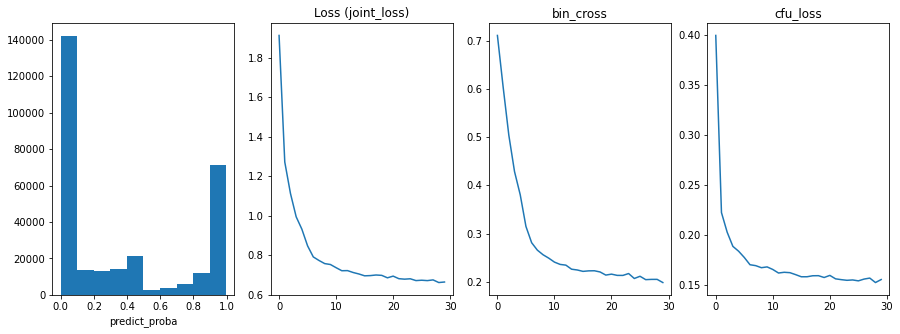

In [24]:
cr_strateos_stained_morph, \
pl_strateos_stained_morph = run_model(model_function=booster_model_v2, lr=0.001,
                                      loss = joint_loss_wrapper(3), metrics = [bin_cross, cfu_loss],
                                      X = X_strateos_stained_morph, Y = Y_strateos_stained_morph, 
                                      epochs = 30, batch_size = 2048,
                                      verbose = False, shuffle = True, plot_type="line")

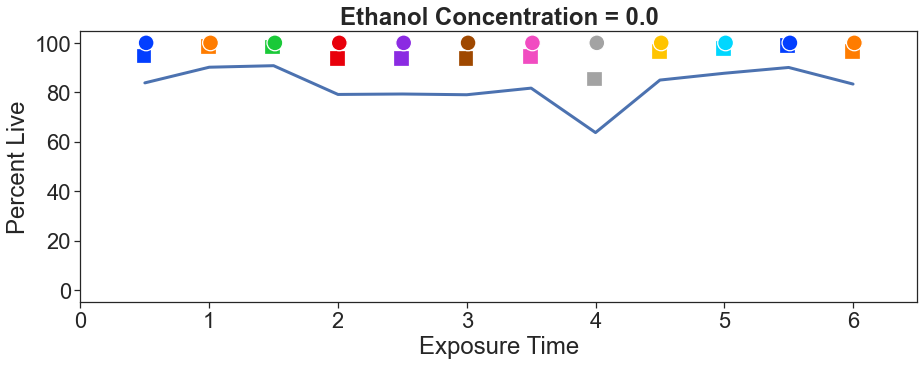

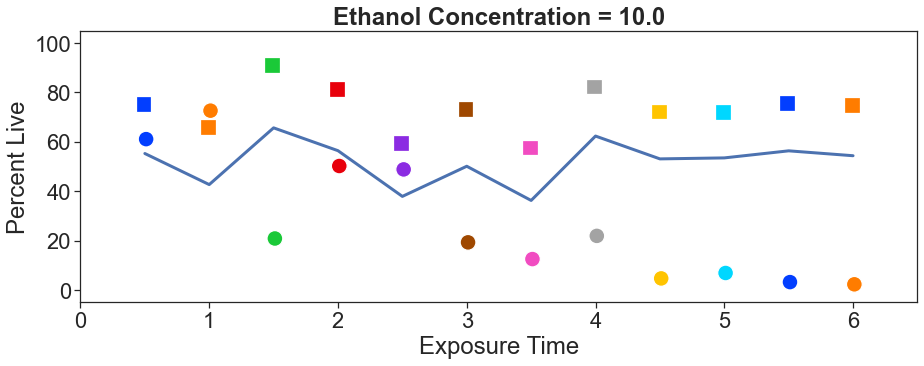

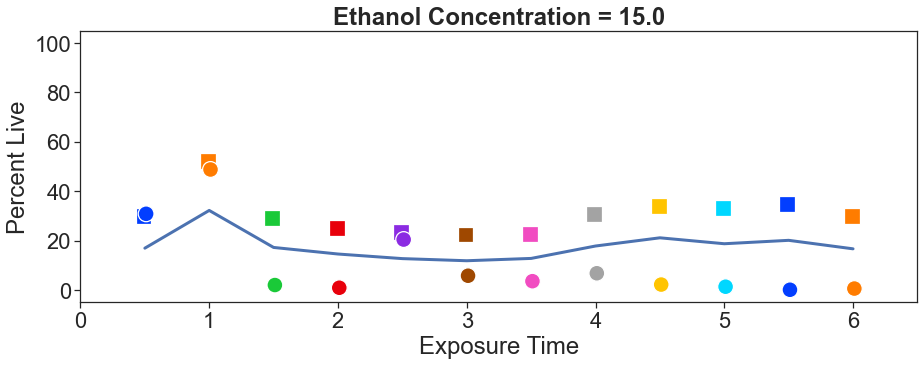

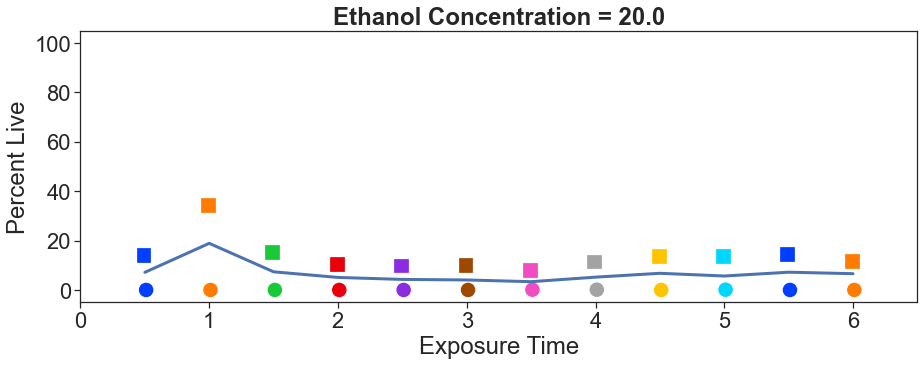

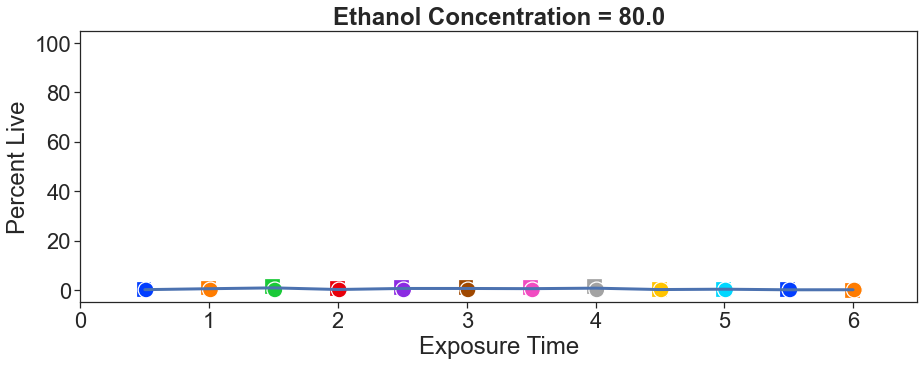

In [25]:
plot_per_cond(cr_strateos_stained_morph)

In [26]:
info_strateos_stained_morph = get_all_run_info(df_strateos_stained_morph, 
                                               X_strateos_stained_morph,
                                               pl_strateos_stained_morph,
                                               append_df_cols=["RL1-A", "RL1-H", "RL1-W"])

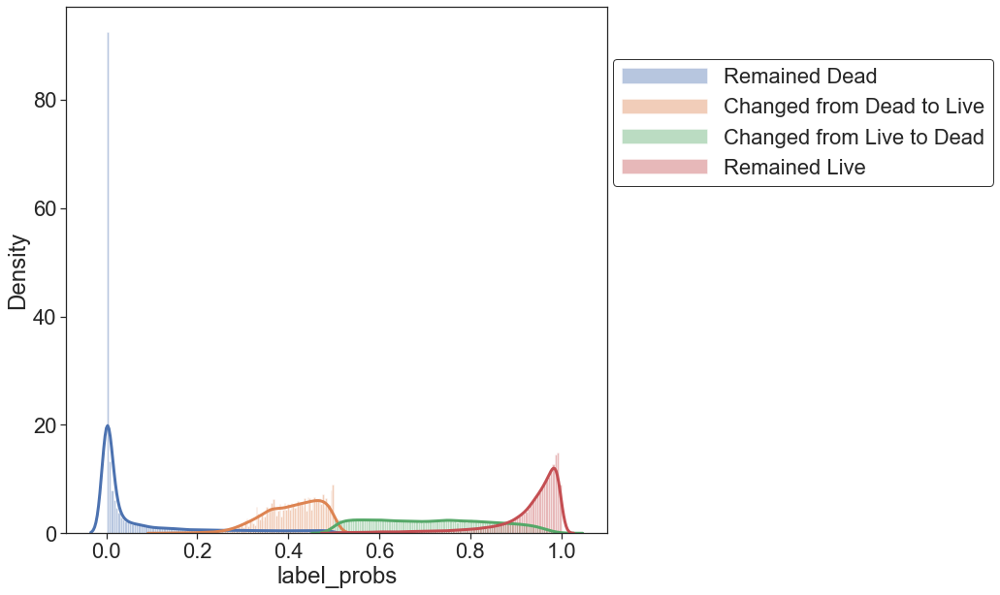

In [27]:
plot_prob_changes(info_strateos_stained_morph, None)

In [28]:
change_type_order = ["Remained Dead", "Changed from Dead to Live",
                     "Changed from Live to Dead", "Remained Live"]
bins = [-.01, .25, .5, 0.75, 1.0]
prob_cats = ['High Confidence of being Dead [0 - 0.25]', 'Low Confidence of being Dead (0.25 - 0.5]',
             'Low Confidence of being Alive (0.5 - 0.75]', 'High Confidence of being Alive (0.75 - 1.0]']

info_strateos_stained_morph['prob_categories'] = pd.cut(info_strateos_stained_morph['label_probs'], 
                                                        bins, labels=prob_cats)

In [29]:
change_title = "Effect of Label-Boosting NN"
proba_title = "Random Forest Model's Prediction Probabilities"

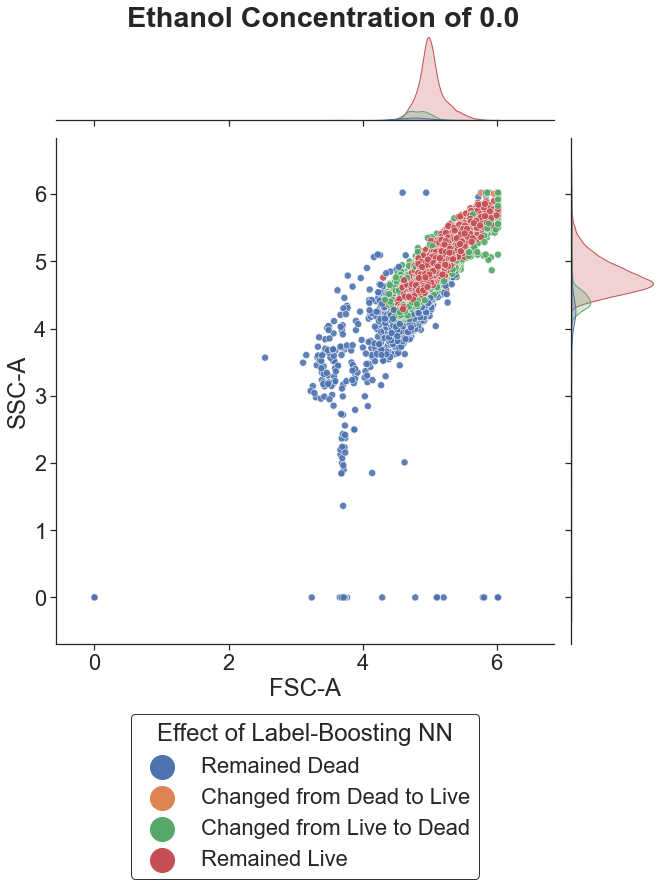

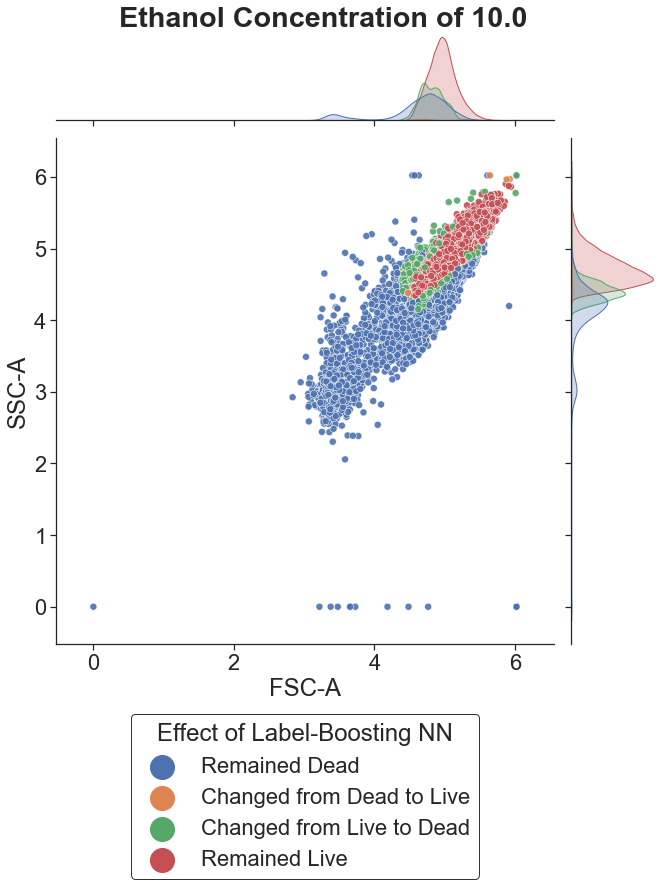

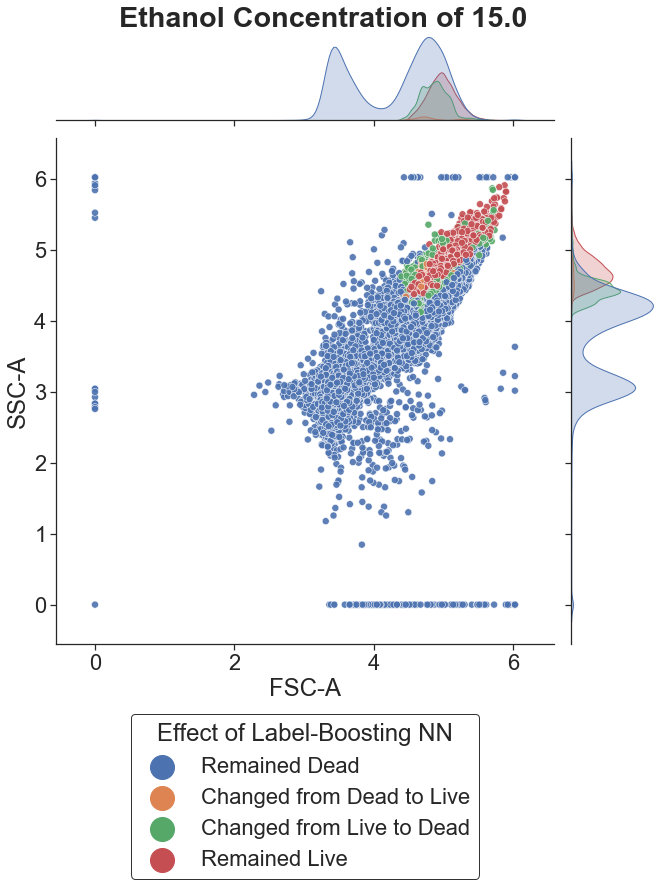

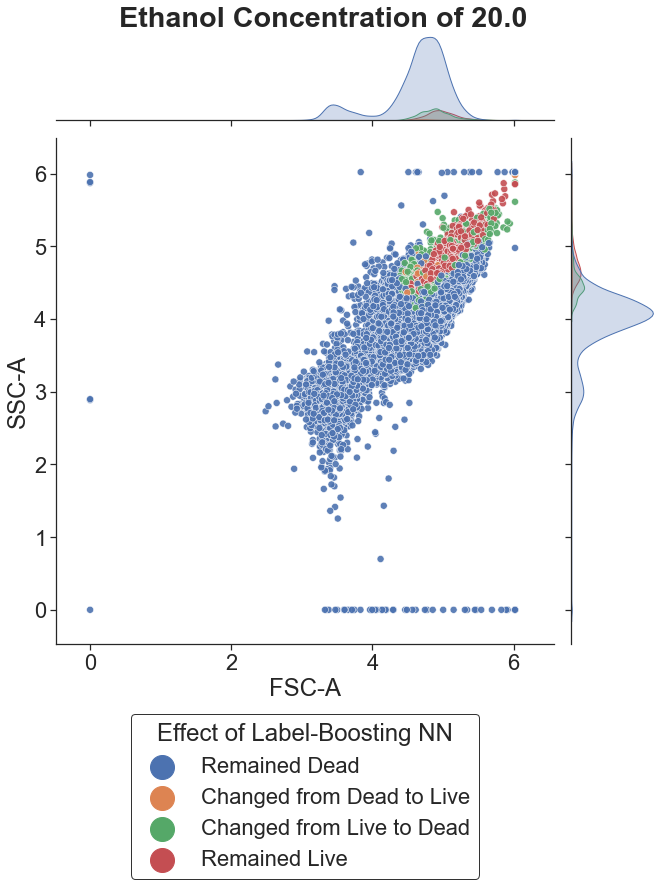

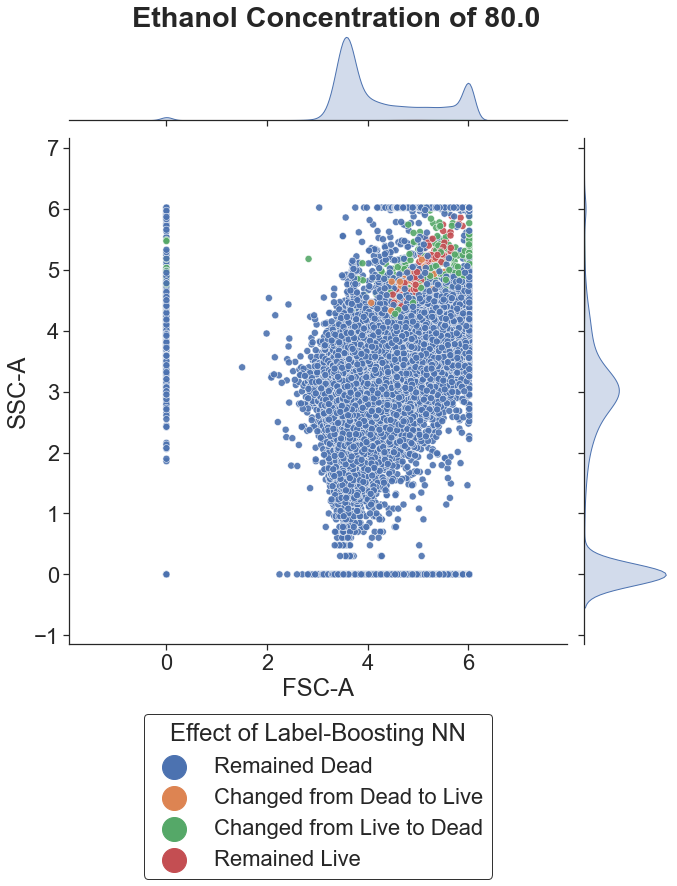

In [30]:
colored_scatter(info_strateos_stained_morph, "FSC-A", "SSC-A", "change_type", change_type_order, change_title, 10)

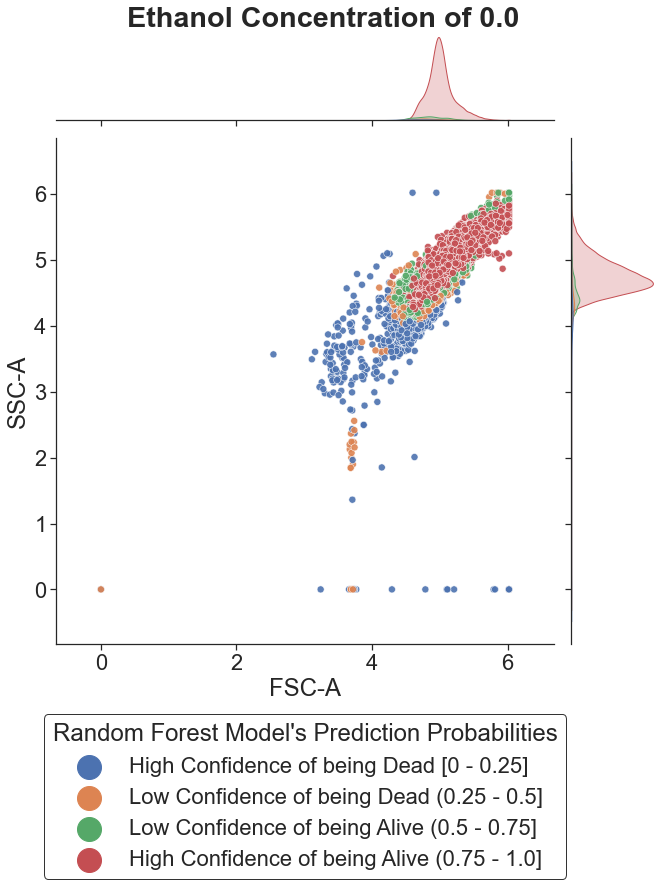

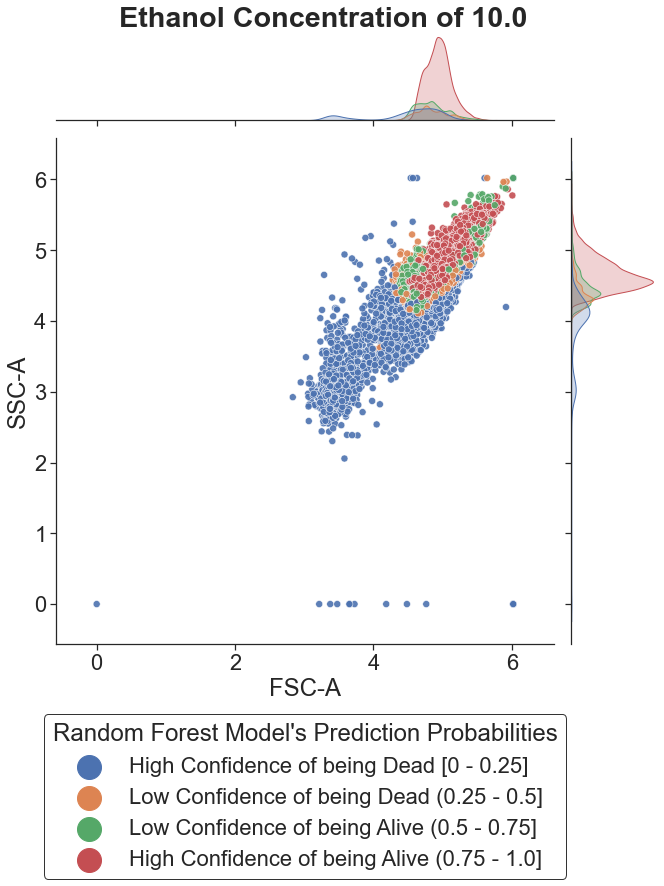

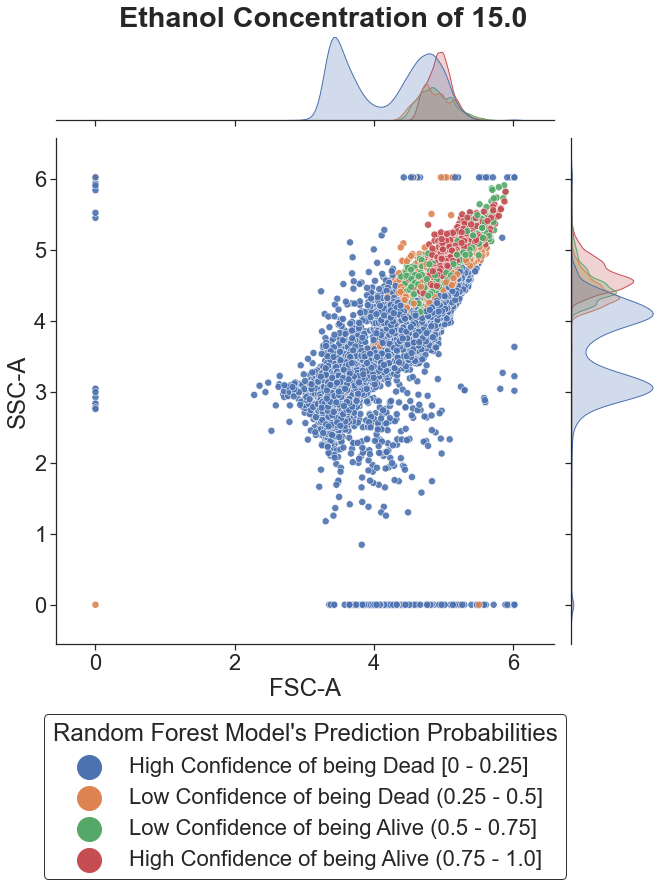

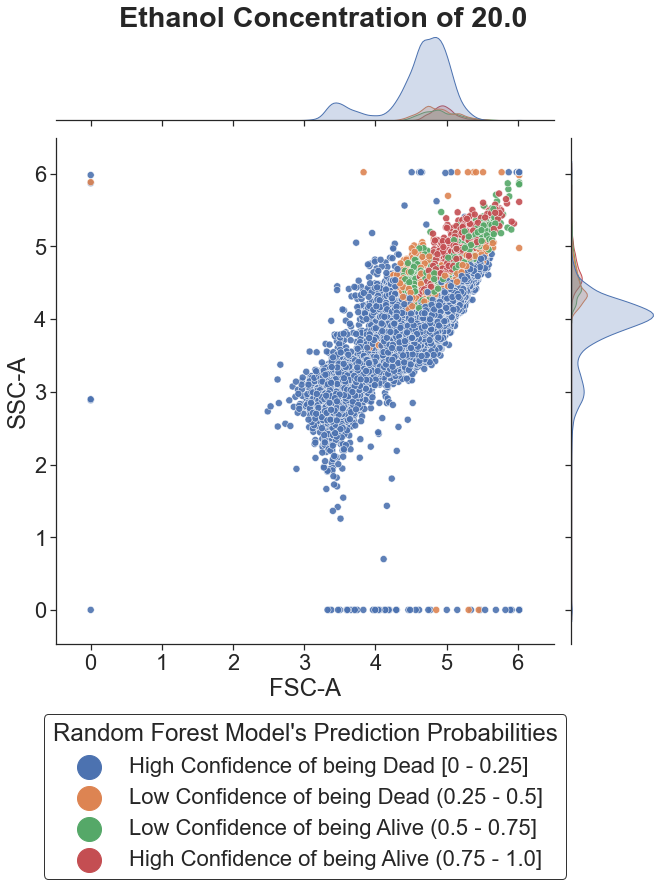

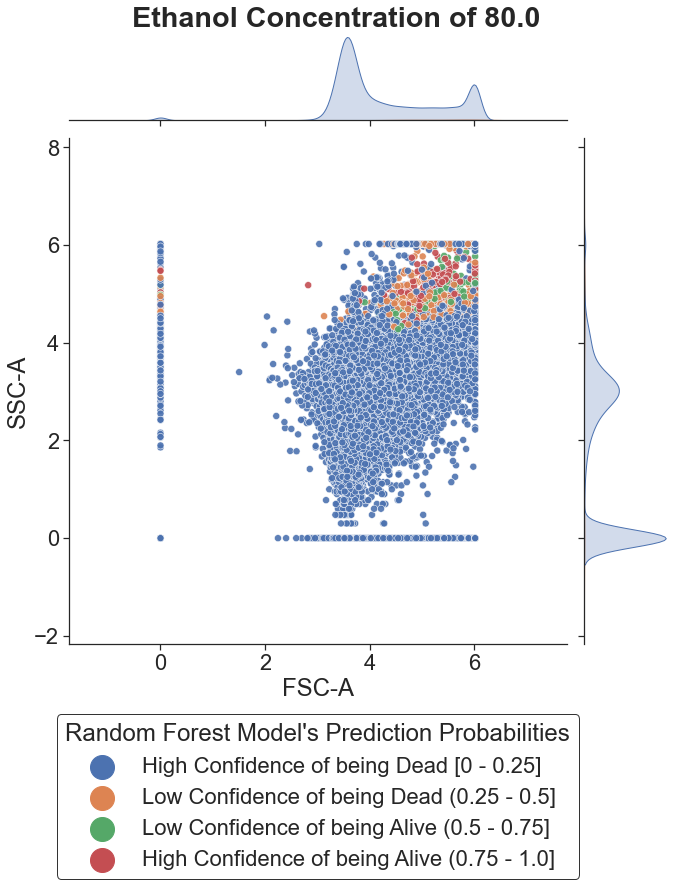

In [31]:
colored_scatter(info_strateos_stained_morph, "FSC-A", "SSC-A", "prob_categories", prob_cats, proba_title, 10)

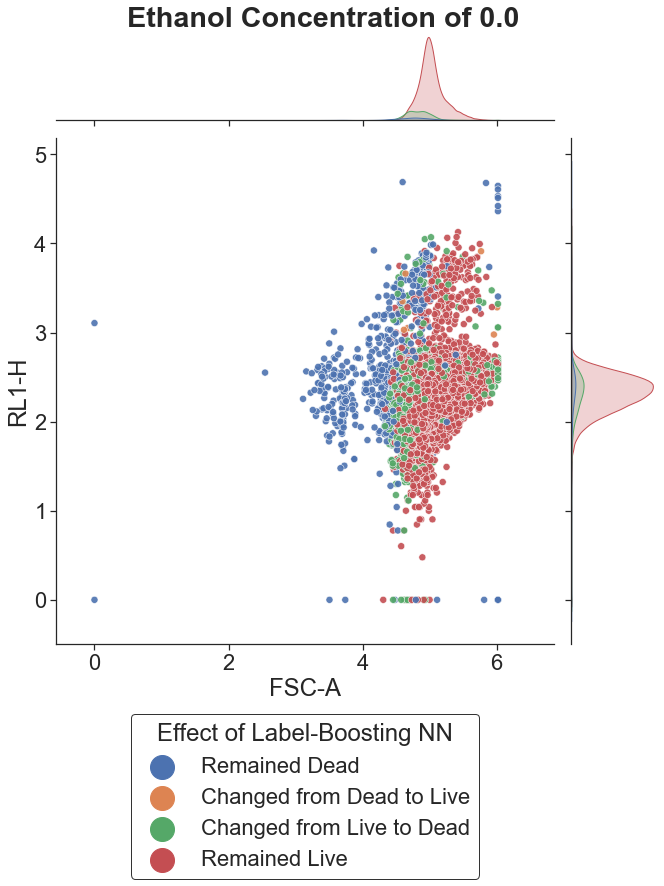

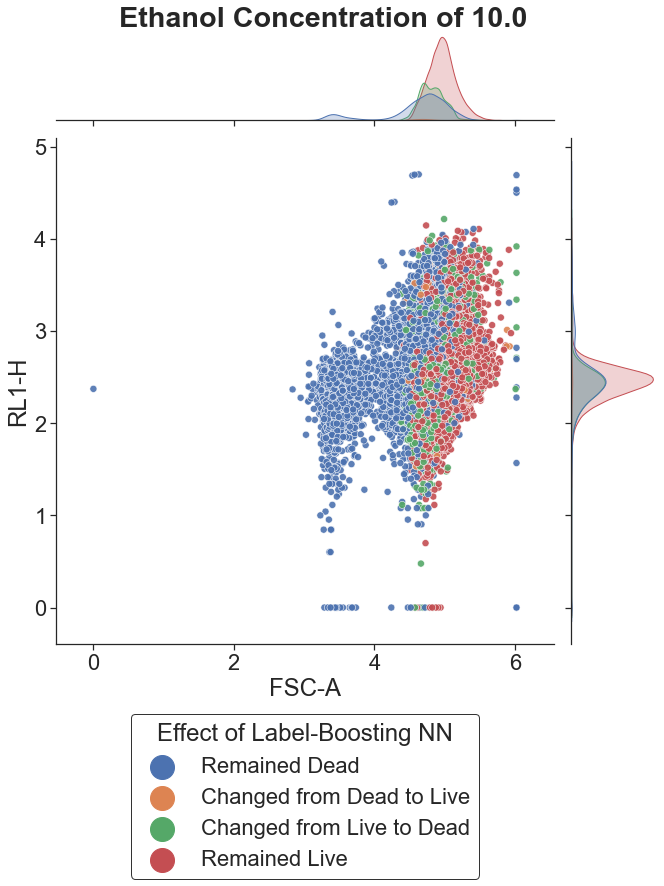

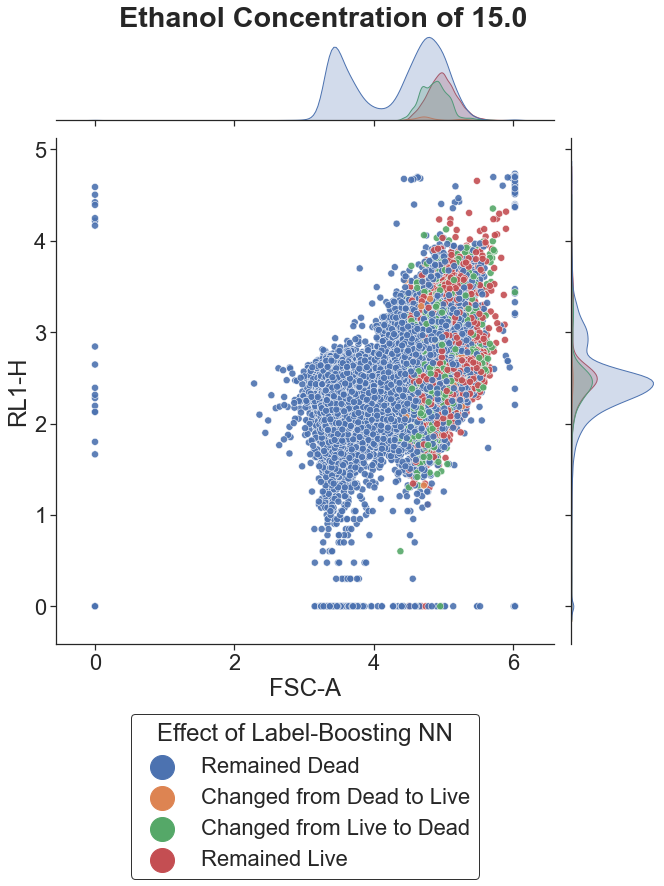

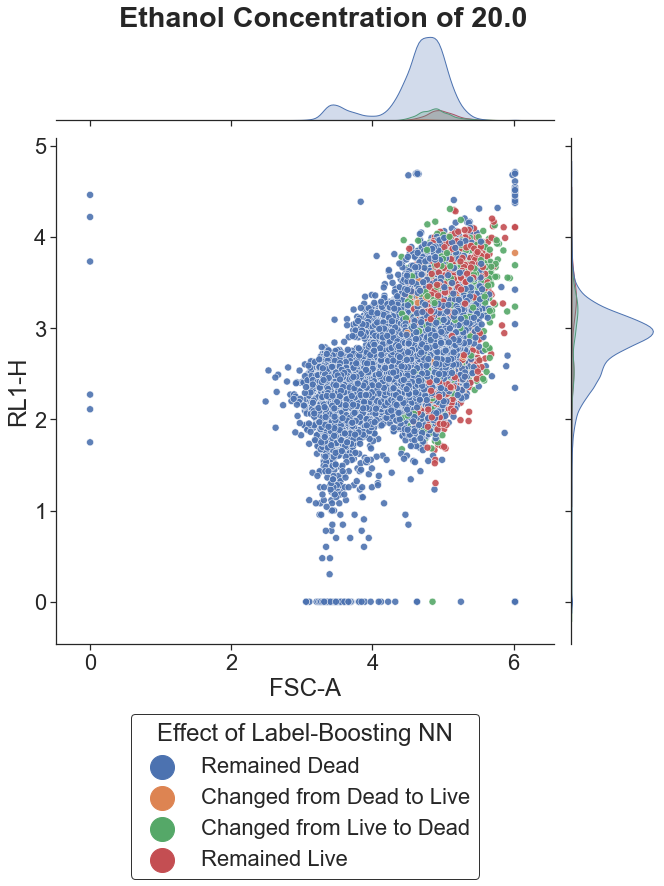

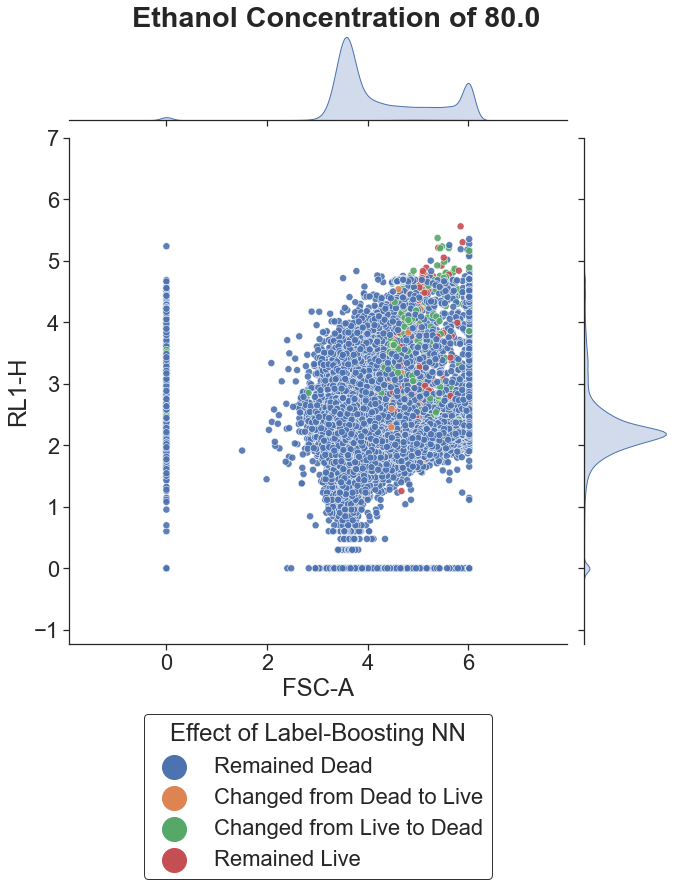

In [32]:
colored_scatter(info_strateos_stained_morph, "FSC-A", "RL1-H", "change_type", change_type_order, change_title, 10)

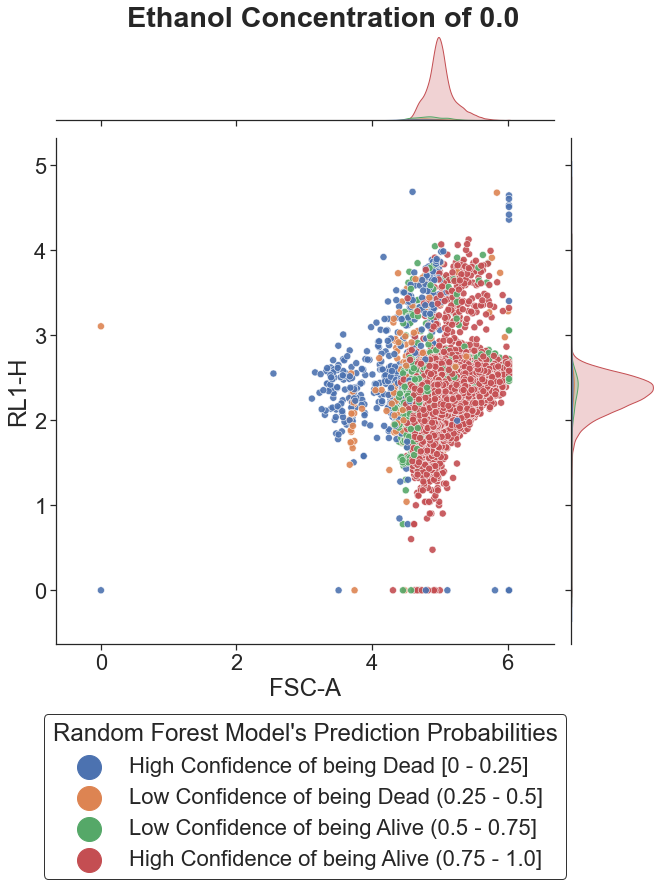

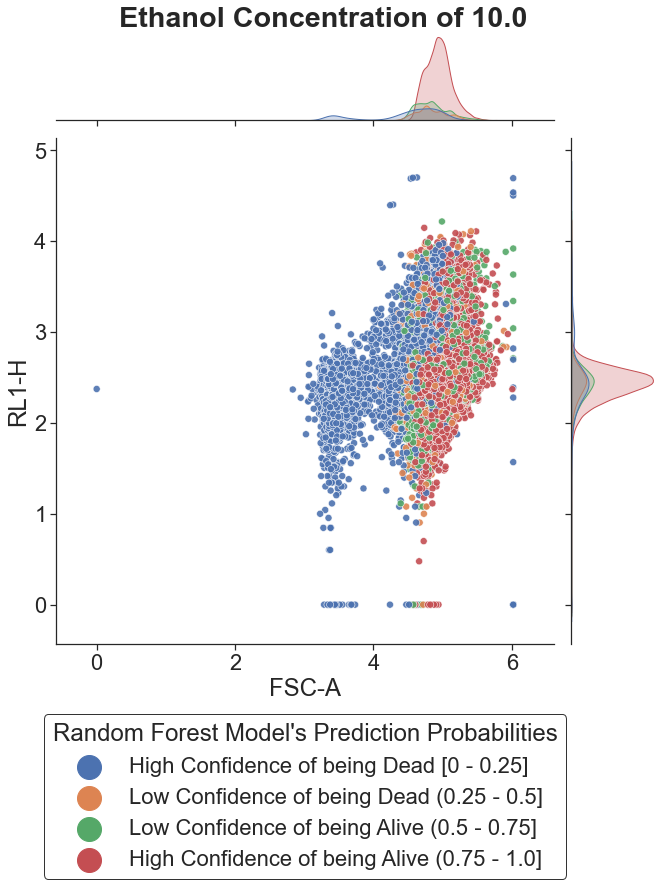

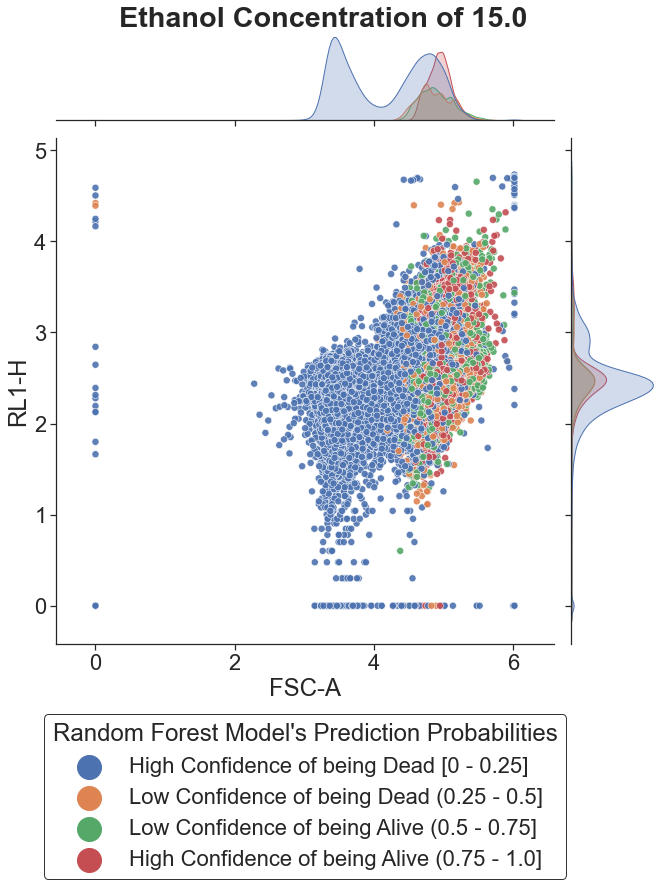

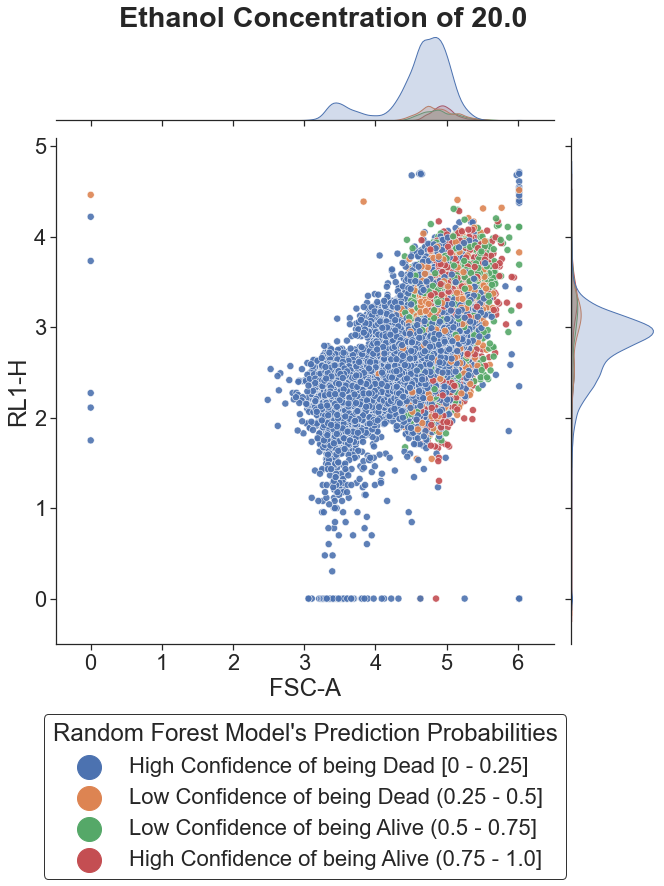

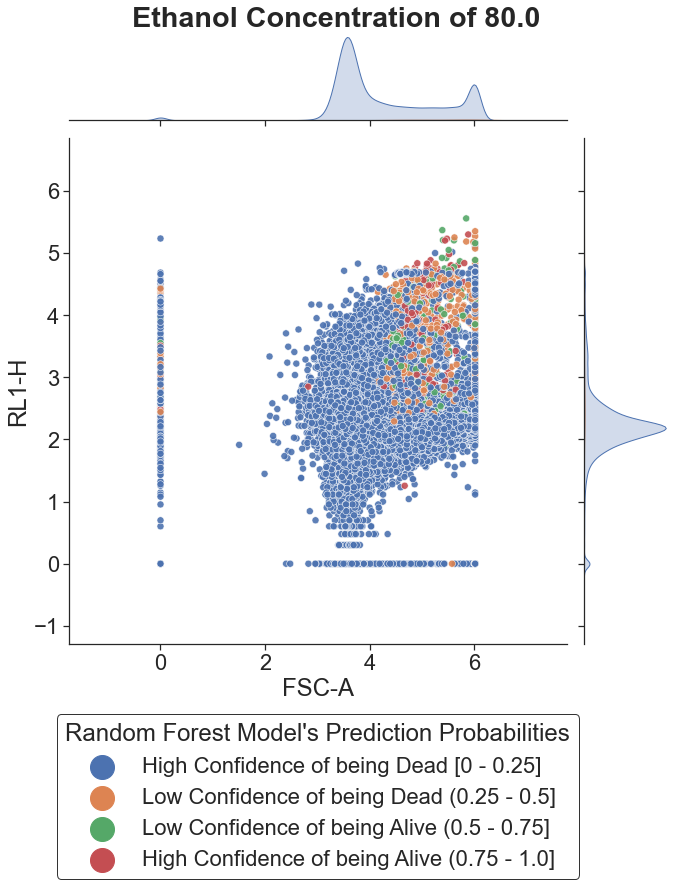

In [33]:
colored_scatter(info_strateos_stained_morph, "FSC-A", "RL1-H", "prob_categories", prob_cats, proba_title, 10)

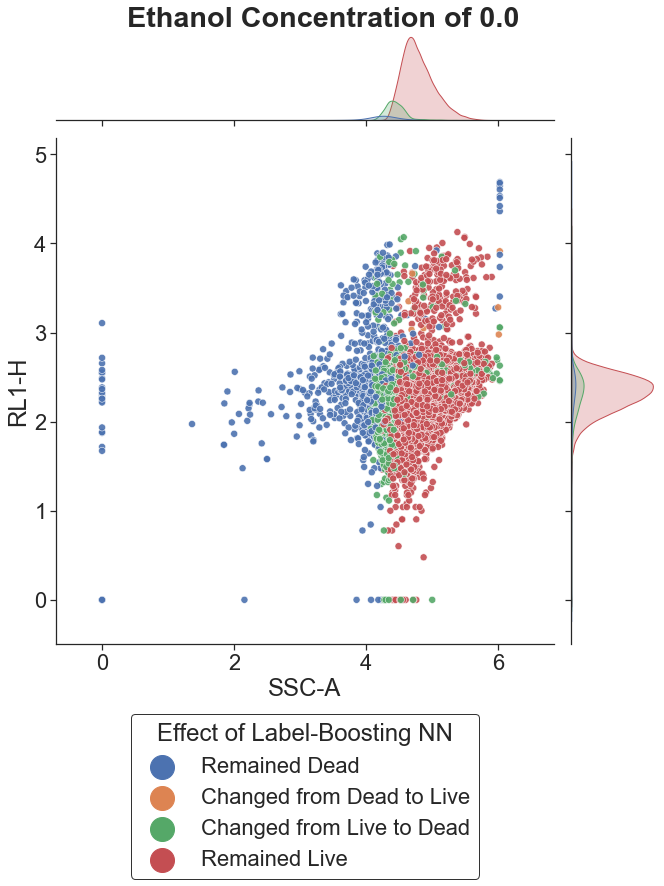

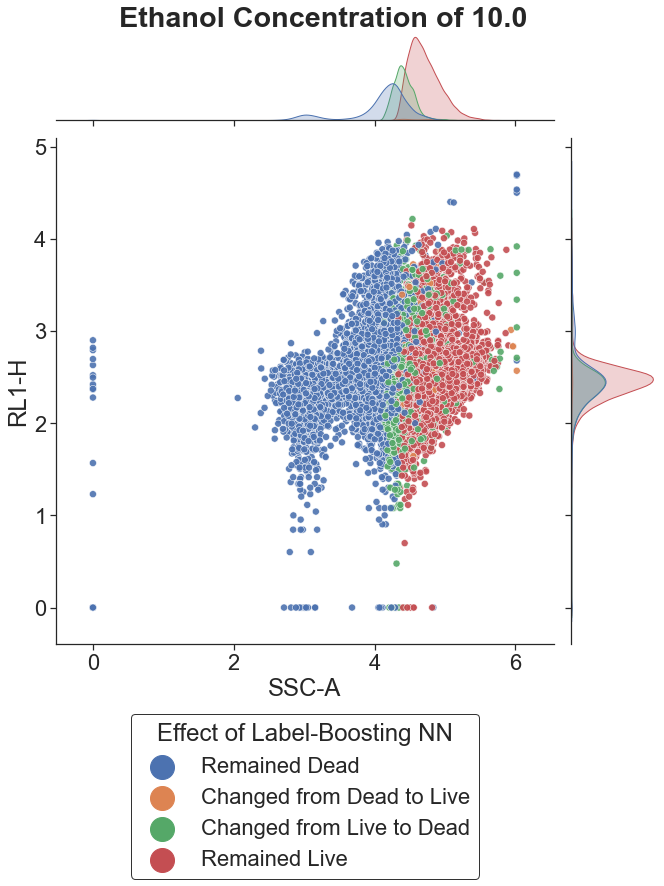

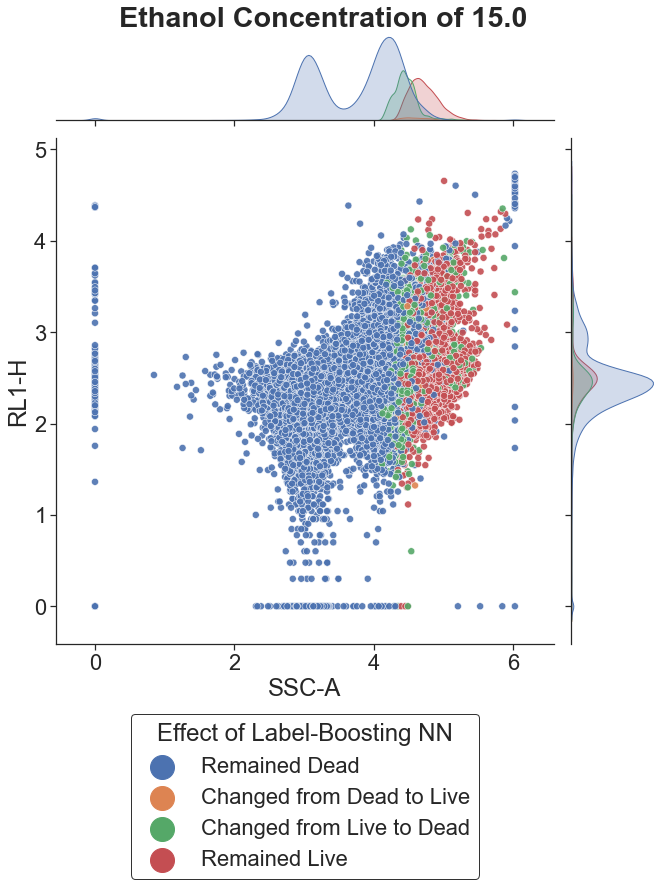

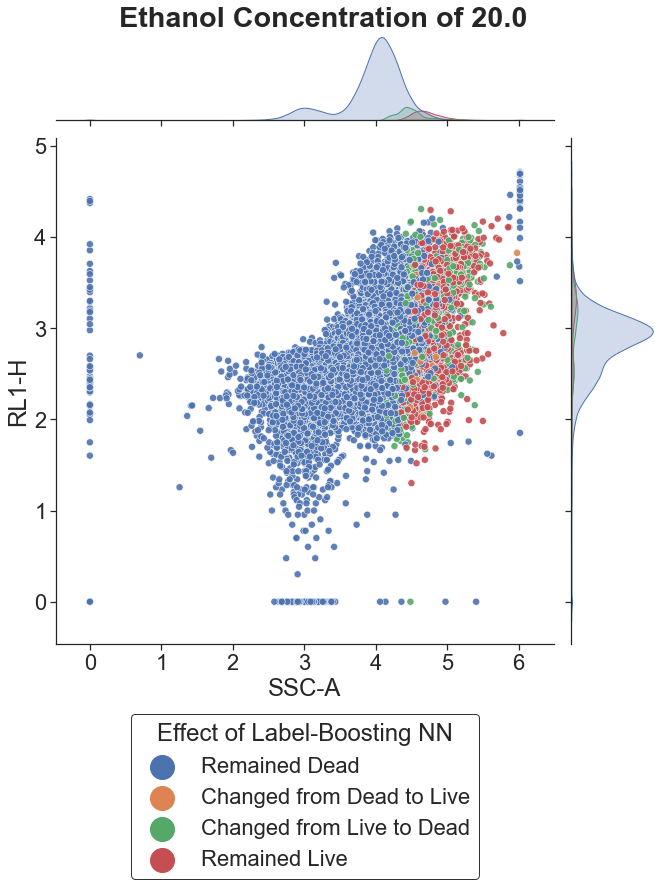

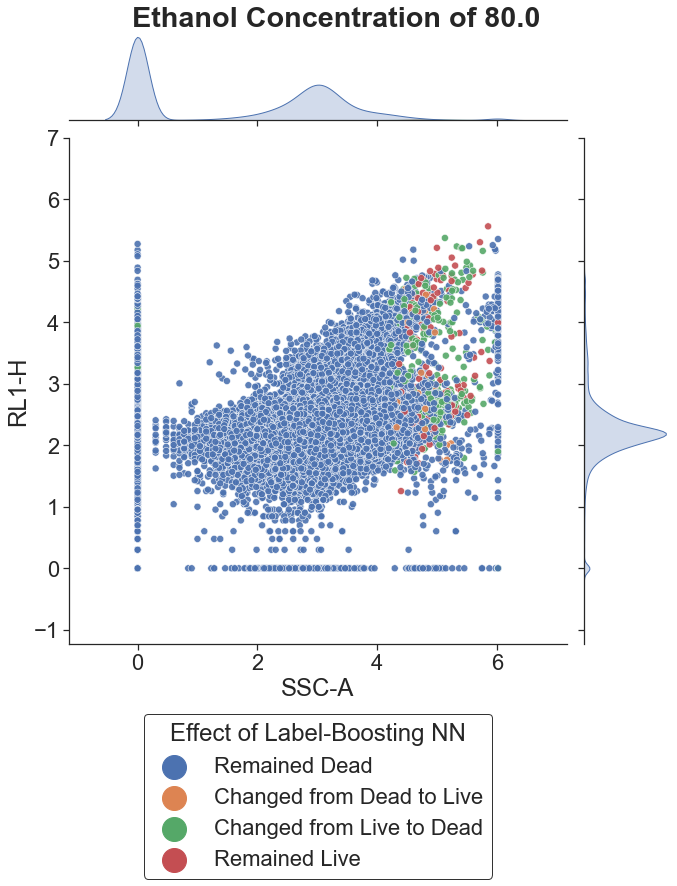

In [34]:
colored_scatter(info_strateos_stained_morph, "SSC-A", "RL1-H", "change_type", change_type_order, change_title, 10)

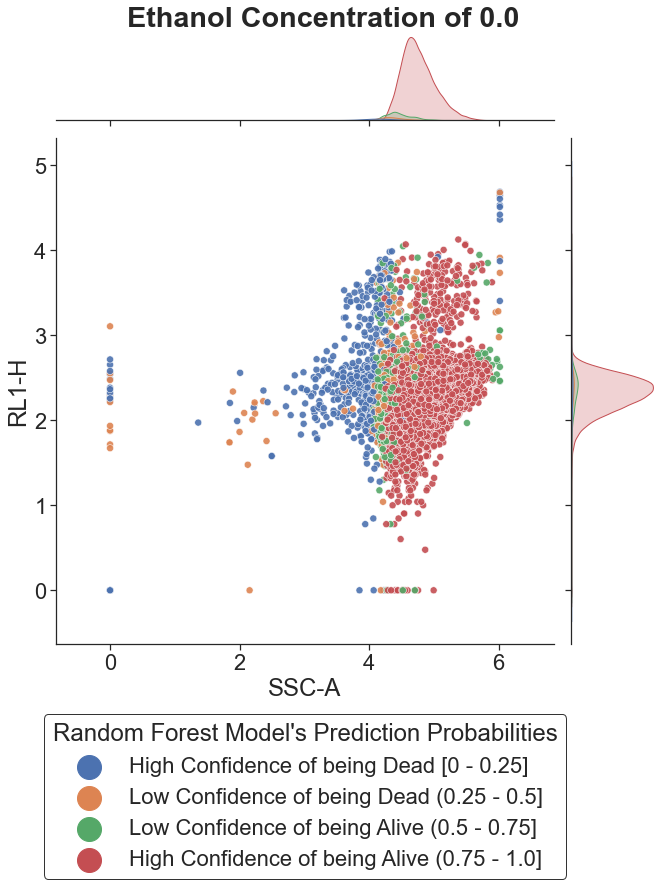

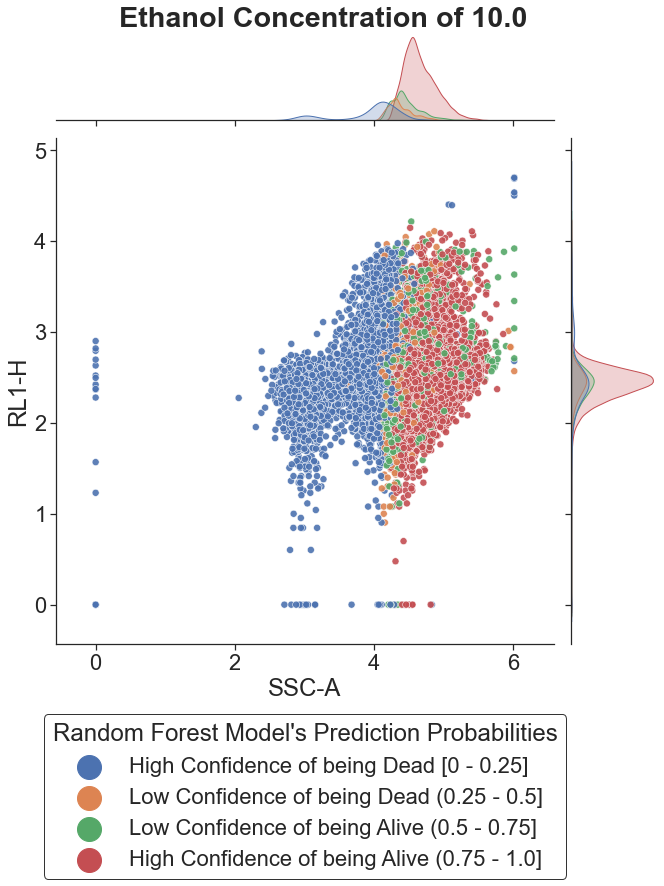

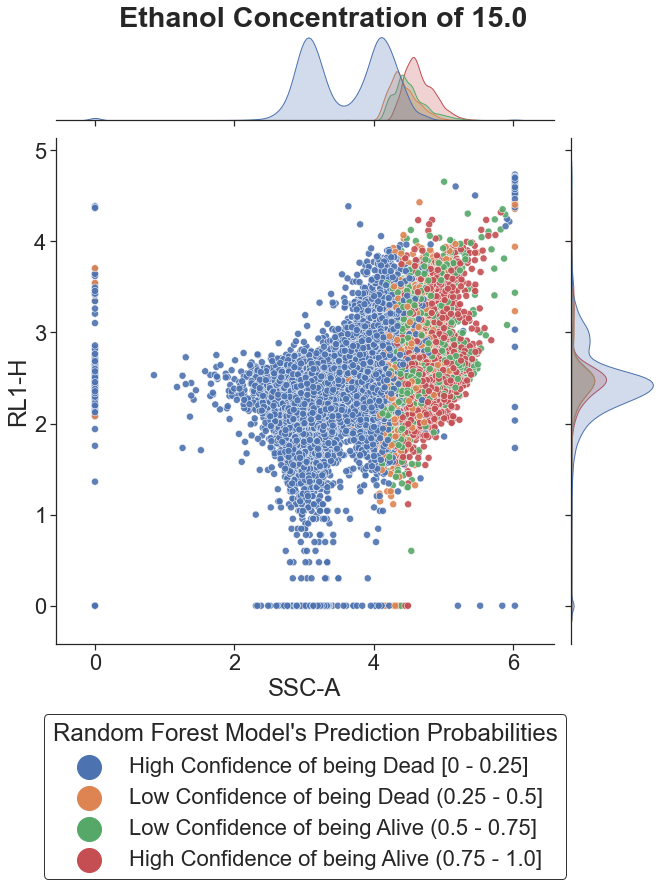

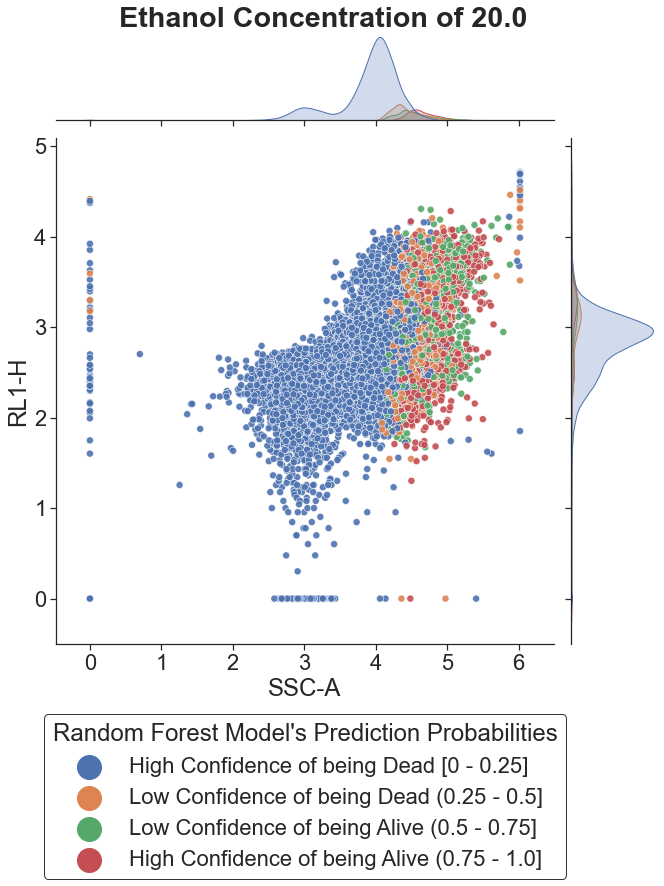

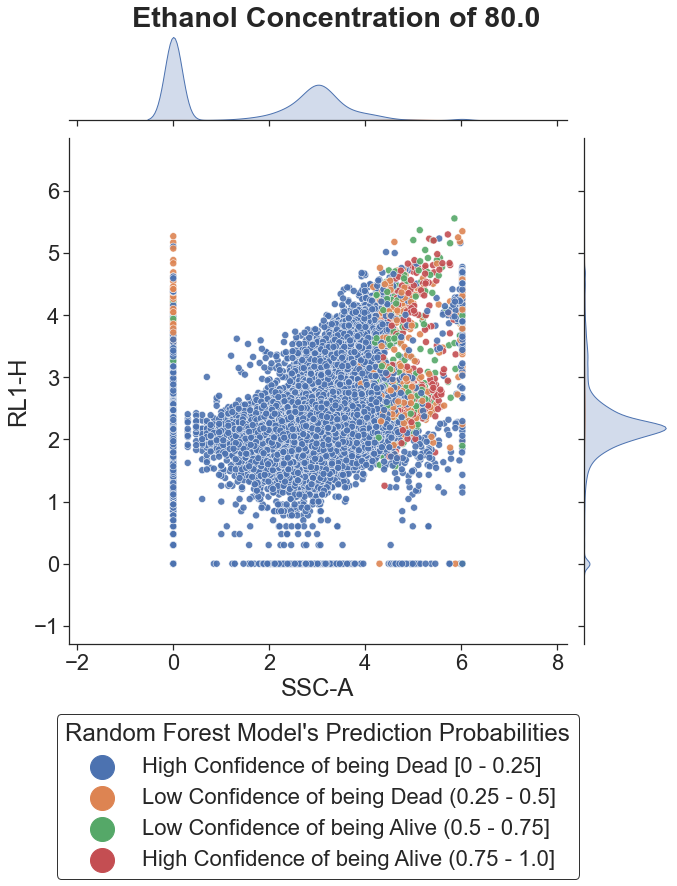

In [35]:
colored_scatter(info_strateos_stained_morph, "SSC-A", "RL1-H", "prob_categories", prob_cats, proba_title, 10)

## New Summary Table

In [36]:
# Based on RL1-H plot, I decided to temporarily use a cutoff of 2.7 RL1-H to classify live/dead with sytox definition

info_strateos_stained_morph["sytox_preds"] = (info_strateos_stained_morph["RL1-H"] < 2.7)

In [37]:
summary_table = info_strateos_stained_morph.groupby([n.inducer_concentration, n.timepoint], as_index=False).mean()

name_weakly = "Weakly Supervised Model (RF)"
name_cfu = "CFUs"
name_weakly_boosted = "Weakly Supervised Model (RF) + Label Boosting (NN)"
name_sytox = "Sytox Definition (2.7 RL1-H cutoff)"

summary_table.rename(columns={"label": name_weakly, 
                              "cfu_percent_live": name_cfu,
                              "nn_preds": name_weakly_boosted,
                              "sytox_preds": name_sytox}, inplace=True)

summary_table = summary_table[[n.inducer_concentration, n.timepoint, 
                               name_weakly, name_cfu, name_weakly_boosted, name_sytox]]
summary_table = summary_table.loc[summary_table[n.timepoint].isin([0.5, 3.0, 6.0])]
summary_table[name_weakly] = (summary_table[name_weakly]*100).astype(int).astype(str) + "%"
summary_table[name_cfu] = summary_table[name_cfu].astype(int).astype(str) + "%"
summary_table[name_weakly_boosted] = (summary_table[name_weakly_boosted]*100).astype(int).astype(str) + "%"
summary_table[name_sytox] = (summary_table[name_sytox]*100).astype(int).astype(str) + "%"

summary_table[n.inducer_concentration] = summary_table[n.inducer_concentration].astype(str)
summary_table[n.timepoint] = summary_table[n.timepoint].astype(str)
# summary_table.to_csv("summary_table.csv", index=False)

summary_table = summary_table.style.set_table_styles([dict(selector='th', props=[('text-align', 'center')])])
summary_table.set_properties(**{'text-align': 'center'}).hide_index()


summary_table

inducer_concentration,timepoint,Weakly Supervised Model (RF),CFUs,Weakly Supervised Model (RF) + Label Boosting (NN),Sytox Definition (2.7 RL1-H cutoff)
0.0,0.5,94%,100%,83%,99%
0.0,3.0,93%,100%,79%,97%
0.0,6.0,96%,100%,83%,99%
10.0,0.5,75%,61%,55%,93%
10.0,3.0,73%,19%,50%,93%
10.0,6.0,74%,2%,54%,93%
15.0,0.5,29%,30%,16%,82%
15.0,3.0,22%,5%,11%,87%
15.0,6.0,29%,0%,16%,83%
20.0,0.5,14%,0%,7%,31%


# New FSC/SSC plots colored by live/dead predictions for 3 types of predictions

In [38]:
info_strateos_stained_morph["sytox_preds"] = info_strateos_stained_morph["sytox_preds"].astype(int)

In [39]:
info_strateos_stained_morph

,FSC-A,FSC-H,FSC-W,SSC-A,SSC-H,SSC-W,RL1-A,RL1-H,RL1-W,label,inducer_concentration,timepoint,cfu_percent_live,nn_preds,changed,change_type,nn_percent_live,label_probs,prob_categories,sytox_preds
0,5.240724,4.843488,1.944483,5.095954,4.765475,1.869232,2.694605,2.278754,0.0,1.0,0.0,0.5,100.0,1.0,False,Remained Live,83.80,0.996220,High Confidence of being Alive (0.75 - 1.0],1
1,4.943989,4.859727,1.612784,4.706598,4.634185,1.518514,0.000000,2.012837,0.0,1.0,0.0,0.5,100.0,1.0,False,Remained Live,83.80,0.951500,High Confidence of being Alive (0.75 - 1.0],1
2,5.292560,4.903025,1.934498,5.257590,5.057571,1.897627,2.271842,2.397940,0.0,1.0,0.0,0.5,100.0,1.0,False,Remained Live,83.80,0.995222,High Confidence of being Alive (0.75 - 1.0],1
3,4.787963,4.759456,1.568202,4.835500,4.742183,1.591065,1.176091,2.155336,0.0,1.0,0.0,0.5,100.0,1.0,False,Remained Live,83.80,0.979643,High Confidence of being Alive (0.75 - 1.0],1
4,5.153077,5.001193,1.672098,5.060547,4.921265,1.643453,2.404834,2.340444,0.0,1.0,0.0,0.5,100.0,1.0,False,Remained Live,83.80,0.978930,High Confidence of being Alive (0.75 - 1.0],1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299995,3.457125,3.337858,0.000000,2.667453,2.632457,0.000000,2.155336,2.505150,0.0,0.0,80.0,6.0,0.0,0.0,False,Remained Dead,0.08,0.000242,High Confidence of being Dead [0 - 0.25],1
299996,3.677789,3.425534,0.000000,3.223236,2.996074,0.000000,1.716003,2.184691,0.0,0.0,80.0,6.0,0.0,0.0,False,Remained Dead,0.08,0.000240,High Confidence of being Dead [0 - 0.25],1
299997,3.611723,3.410777,0.000000,2.611723,2.928396,0.000000,0.000000,1.838849,0.0,0.0,80.0,6.0,0.0,0.0,False,Remained Dead,0.08,0.000242,High Confidence of being Dead [0 - 0.25],1
299998,4.384067,3.602386,0.000000,0.000000,2.320146,0.000000,0.000000,1.973128,0.0,0.0,80.0,6.0,0.0,0.0,False,Remained Dead,0.08,0.000431,High Confidence of being Dead [0 - 0.25],1


In [40]:
model_dict = {"Random Forest Model": "label",
              "Boosting Deep Learning Model": "nn_preds",
              "Manual Gating via Sytox Threshold": "sytox_preds"}

# for key, value in model_dict.items():
#     colored_scatter(info_strateos_stained_morph, "FSC-A", "SSC-A", 
#                     value, [0, 1], key, 10, False)

In [41]:
def colored_scatter_2(info, x, y, hue, hue_order, legend_title, height=12, legend=True, concs=[0.0, 20.0, 80.0]):
    for conc in concs:
        conc_df = info.loc[info[n.inducer_concentration] == conc]
        jp = sns.jointplot(data=conc_df, x=x, y=y, hue=hue, 
                           hue_order=hue_order, s=50, alpha=0.7, height=height)
        if legend:
            jp.ax_joint.legend(bbox_to_anchor=(0.5, -0.3), loc=10, title=legend_title,
                               borderaxespad=0.0, markerscale=4).get_frame().set_edgecolor('black')
        else:
            jp.ax_joint.get_legend().remove()

In [42]:
# colored_scatter_2(info_strateos_stained_morph, "FSC-A", "SSC-A", 
#                   "label", [1, 0], "Random Forest Model", 10, False)

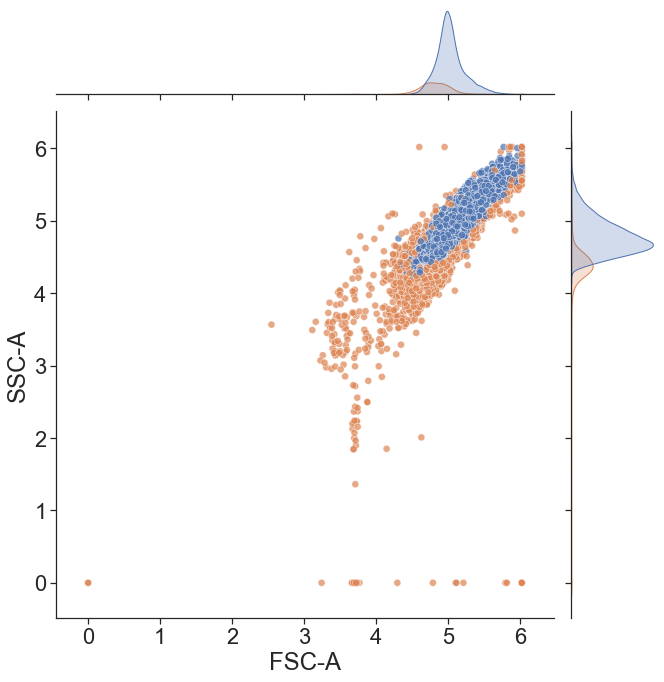

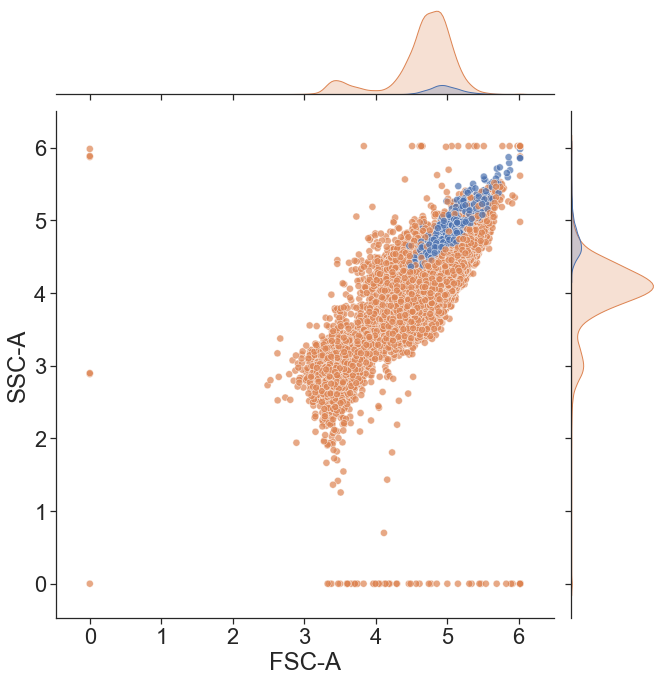

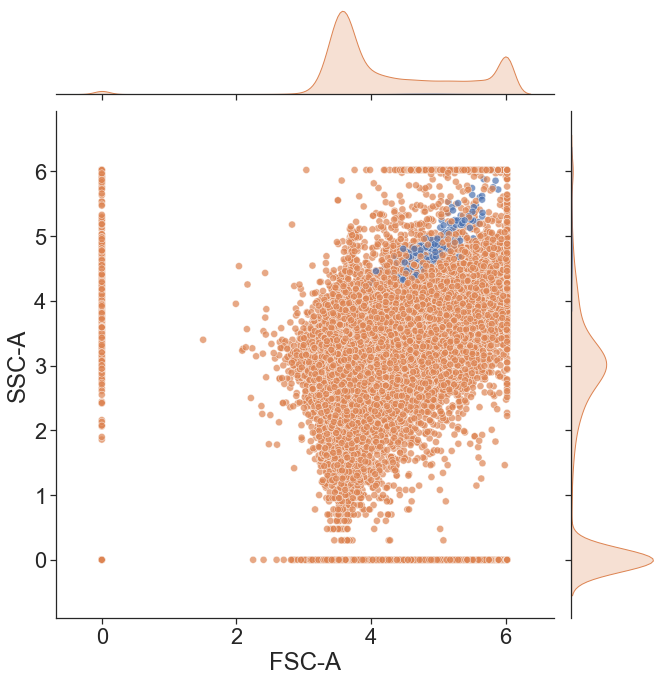

In [43]:
colored_scatter_2(info_strateos_stained_morph, "FSC-A", "SSC-A", 
                  "nn_preds", [1, 0], "Boosting Deep Learning Model", 10, False)

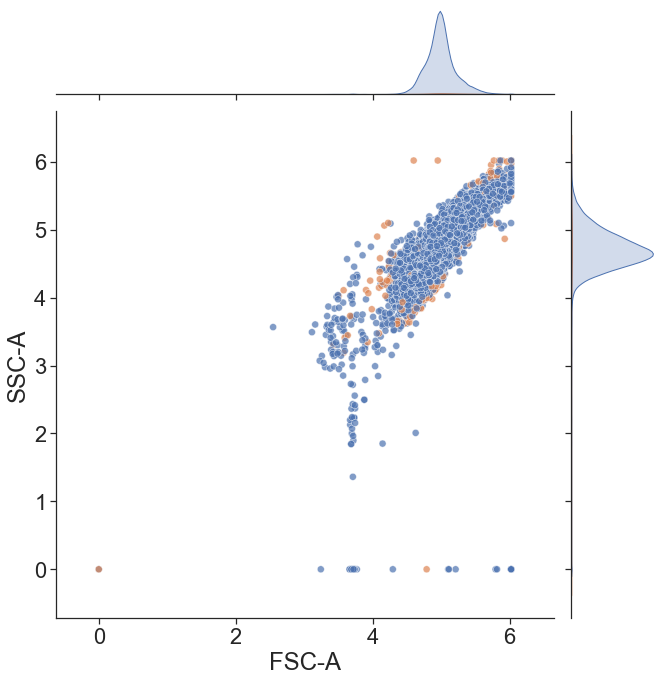

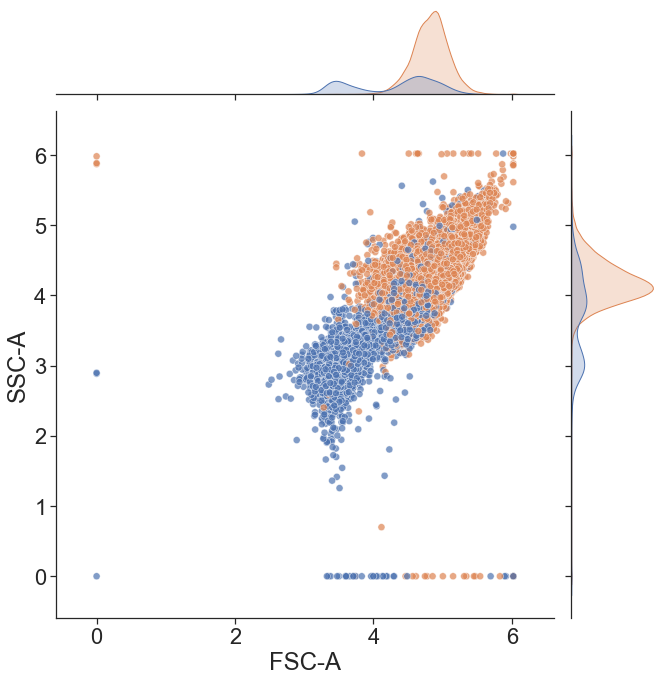

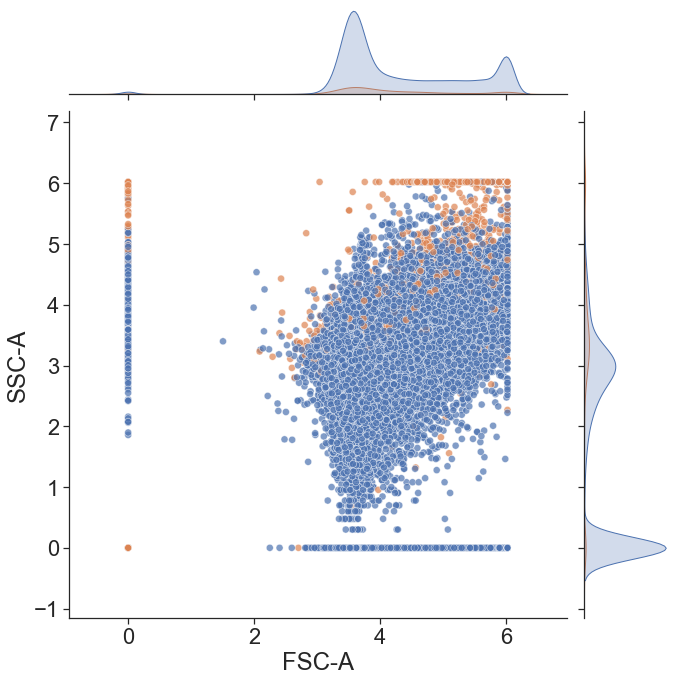

In [44]:
colored_scatter_2(info_strateos_stained_morph, "FSC-A", "SSC-A", 
                  "sytox_preds", [1, 0], "Manual Gating via Sytox Threshold", 10, False)

# Scatter + KDE Plots

In [356]:
def get_point_density_values(x, y):
    xy = np.vstack([x,y])
    return gaussian_kde(xy)(xy)



def get_conc_df_with_kde_values(conc):
    if conc == "all":
        # Getting KDE values for all the data takes a longgggg time, so going to take a sample:
        conc_df = info_strateos_stained_morph.sample(frac=0.2, random_state=5)
    else:
        conc_df = info_strateos_stained_morph.loc[info_strateos_stained_morph[n.inducer_concentration] == conc]
    
    # create unlogged features
    for f in features_stained_strateos:
        conc_df["log_{}".format(f)] = conc_df[f]
        conc_df[f] = conc_df[f].pow(10)
        
    # calculate point densities for (SSC-A, FSC-A) and (RL1-H, FSC-A)
    conc_df["kde_S_F"] = get_point_density_values(x=conc_df["FSC-A"], y=conc_df["SSC-A"])
    conc_df["kde_R_F"] = get_point_density_values(x=conc_df["RL1-H"], y=conc_df["SSC-A"])
    conc_df["kde_log_S_F"] = get_point_density_values(x=conc_df["log_FSC-A"], y=conc_df["log_SSC-A"])
    conc_df["kde_log_R_F"] = get_point_density_values(x=conc_df["log_RL1-H"], y=conc_df["log_SSC-A"])
    
    return conc_df


In [354]:
def kde_scatter(conc_df, logged=False, subset_ratio=0.5, 
                log_kde=False, n_bins=None, cmap="Spectral_r", 
                pred_col=None, pred_display_type="scatter_density",
                line_params=([2.4, 3.05], [4, 5.75])):
    dot_size = 1
    conc_df = conc_df.copy()
    
    fig = plt.figure(figsize=(20, 9))
    num_plot_cols = 2 
    ax1 = plt.subplot(1, num_plot_cols, 1)
    ax3 = plt.subplot(1, num_plot_cols, num_plot_cols)
    
    if logged:
        ssc = "log_SSC-A"
        rl1 = "log_RL1-H"
        fsc = "log_FSC-A"
        kde_sf = "kde_log_S_F"
        kde_rf = "kde_log_R_F"
    else:
        ssc = "SSC-A"
        rl1 = "RL1-H"
        fsc = "FSC-A"
        kde_sf = "kde_S_F"
        kde_rf = "kde_R_F"
        
    # Sort the points by density, so that the densest points appear on top
    conc_df = conc_df.sort_values(by=kde_sf)
    
    # log kde values if specified
    if log_kde is True:
        conc_df[kde_sf] = np.log10(conc_df[kde_sf])
        conc_df[kde_rf] = np.log10(conc_df[kde_rf])
    
    # switch to plotting bins if n_bins is specified
    if n_bins is not None:
        conc_df[kde_sf] = pd.qcut(conc_df[kde_sf], n_bins, labels=False)
        conc_df[kde_rf] = pd.qcut(conc_df[kde_rf], n_bins, labels=False)

    # First plot:
    ax1.scatter(conc_df[ssc], conc_df[fsc], c=conc_df[kde_sf], s=dot_size, cmap=cmap)
    ax1.set_xlabel(ssc)
    ax1.set_ylabel(fsc)
  
    # Get subset of data based on percentage specified by subset_ratio (tail works because we sorted earlier)
    subset_df = conc_df.tail(int(len(conc_df)*subset_ratio))
    
    # Second plot: overlay alpha_shape of the subset we got
    # first doing a KMeans with 2 clusters to get an alpha shape around each ellipse
    subset_df["kmeans"] = KMeans(n_clusters=2, random_state=5).fit(subset_df[[ssc, fsc]]).labels_   
    subset_boundary_1 = alphashape.alphashape(list(zip(subset_df.loc[subset_df["kmeans"] == 0, ssc], 
                                                       subset_df.loc[subset_df["kmeans"] == 0, fsc])), 0)
    subset_boundary_2 = alphashape.alphashape(list(zip(subset_df.loc[subset_df["kmeans"] == 1, ssc], 
                                                       subset_df.loc[subset_df["kmeans"] == 1, fsc])), 0)
    ax1.add_patch(PolygonPatch(subset_boundary_1, alpha=1.0, ec="cyan", fc="none", lw=5))
#     ax1.add_patch(PolygonPatch(subset_boundary_2, alpha=1.0, ec="cyan", fc="none", lw=5))

    # Third plot:
    subset_no_debris = subset_df.loc[subset_df["kmeans"] == 0]
    ax3.scatter(subset_no_debris[rl1], subset_no_debris[fsc], 
                c=get_point_density_values(x=subset_no_debris[rl1], y=subset_no_debris[fsc]), 
                s=dot_size, cmap=cmap)
    ax3.set_xlabel(rl1)
    ax3.set_ylabel(fsc)
    ax3.set_ylim(ax1.get_ylim())
    ax3.set_xlim(right=5)
    # Overlay boundary line (eyeballing it like they do in SOA):
    ax3.plot(line_params[0], line_params[1], c="cyan")
        
    if pred_col is not None:
        if pred_display_type == "scatter_density":
            fig = plt.figure(figsize=(20, 20))
            ax4 = plt.subplot(2, 2, 1)
            ax5 = plt.subplot(2, 2, 2)
            ax6 = plt.subplot(2, 2, 3)
            ax7 = plt.subplot(2, 2, 4)
            
            ax4.scatter(conc_df.loc[conc_df[pred_col] == 1, ssc],
                        conc_df.loc[conc_df[pred_col] == 1, fsc],
                        c=get_point_density_values(x=conc_df.loc[conc_df[pred_col] == 1, ssc],
                                                   y=conc_df.loc[conc_df[pred_col] == 1, fsc]),
                        s=dot_size, cmap=cmap)
            ax5.scatter(subset_df.loc[subset_df[pred_col] == 1, rl1],
                        subset_df.loc[subset_df[pred_col] == 1, fsc],
                        c=get_point_density_values(x=subset_df.loc[subset_df[pred_col] == 1, rl1],
                                                   y=subset_df.loc[subset_df[pred_col] == 1, fsc]),
                        s=dot_size, cmap=cmap)
            ax6.scatter(conc_df.loc[conc_df[pred_col] == 0, ssc],
                        conc_df.loc[conc_df[pred_col] == 0, fsc],
                        c=get_point_density_values(x=conc_df.loc[conc_df[pred_col] == 0, ssc],
                                                   y=conc_df.loc[conc_df[pred_col] == 0, fsc]),
                        s=dot_size, cmap=cmap)
            ax7.scatter(subset_df.loc[subset_df[pred_col] == 0, rl1],
                        subset_df.loc[subset_df[pred_col] == 0, fsc],
                        c=get_point_density_values(x=subset_df.loc[subset_df[pred_col] == 0, rl1],
                                                   y=subset_df.loc[subset_df[pred_col] == 0, fsc]),
                        s=dot_size, cmap=cmap)
            ax5.plot(line_params[0], line_params[1], c="cyan")
            ax7.plot(line_params[0], line_params[1], c="cyan")
            
            ax4.set_title("Live Predictions", fontweight="bold")
            ax5.set_title("Live Predictions", fontweight="bold")
            ax6.set_title("Dead or Debris Predictions", fontweight="bold")
            ax7.set_title("Dead or Debris Predictions", fontweight="bold")
            
            ax4.set_xlim(ax1.get_xlim())
            ax5.set_xlim(ax3.get_xlim())
            ax6.set_xlim(ax1.get_xlim())
            ax7.set_xlim(ax3.get_xlim())
            ax4.set_xlabel(ssc)
            ax5.set_xlabel(rl1)
            ax6.set_xlabel(ssc)
            ax7.set_xlabel(rl1)
            
            ax4.set_ylim(ax1.get_ylim())
            ax5.set_ylim(ax1.get_ylim())
            ax6.set_ylim(ax1.get_ylim())
            ax7.set_ylim(ax1.get_ylim())
            ax4.set_ylabel(fsc)
            ax5.set_ylabel(fsc)
            ax6.set_ylabel(fsc)
            ax7.set_ylabel(fsc)

        elif pred_display_type == "alpha_shape":
            live = list(zip(conc_df.loc[conc_df[pred_col] == 1, ssc], 
                            conc_df.loc[conc_df[pred_col] == 1, fsc]))
            dead = list(zip(conc_df.loc[conc_df[pred_col] == 0, ssc], 
                            conc_df.loc[conc_df[pred_col] == 0, fsc]))
            live[:] = [x for x in live if x != (0,0)]
            dead[:] = [x for x in dead if x != (0,0)]
            live_shape = alphashape.alphashape(live, 0)
            dead_shape = alphashape.alphashape(dead, 0)
            ax1.add_patch(PolygonPatch(live_shape, alpha=1.0, ec="cyan", fc="none", lw=5))
            ax1.add_patch(PolygonPatch(dead_shape, alpha=1.0, ec="hotpink", fc="none", lw=5))

            live = list(zip(subset_df.loc[subset_df[pred_col] == 1, rl1], 
                            subset_df.loc[subset_df[pred_col] == 1, fsc]))
            dead = list(zip(subset_df.loc[subset_df[pred_col] == 0, rl1], 
                            subset_df.loc[subset_df[pred_col] == 0, fsc]))
            live[:] = [x for x in live if x != (0,0)]
            dead[:] = [x for x in dead if x != (0,0)]
            live_shape = alphashape.alphashape(live, 0)
            dead_shape = alphashape.alphashape(dead, 0)
            ax3.add_patch(PolygonPatch(live_shape, alpha=1.0, ec="cyan", fc="none", lw=5))
            ax3.add_patch(PolygonPatch(dead_shape, alpha=1.0, ec="hotpink", fc="none", lw=5))
        else:
            raise ValueError("pred_display_type must equal 'scatter_density' or 'alpha_shape'"
                             "when pred_col is not None.")
    plt.show()

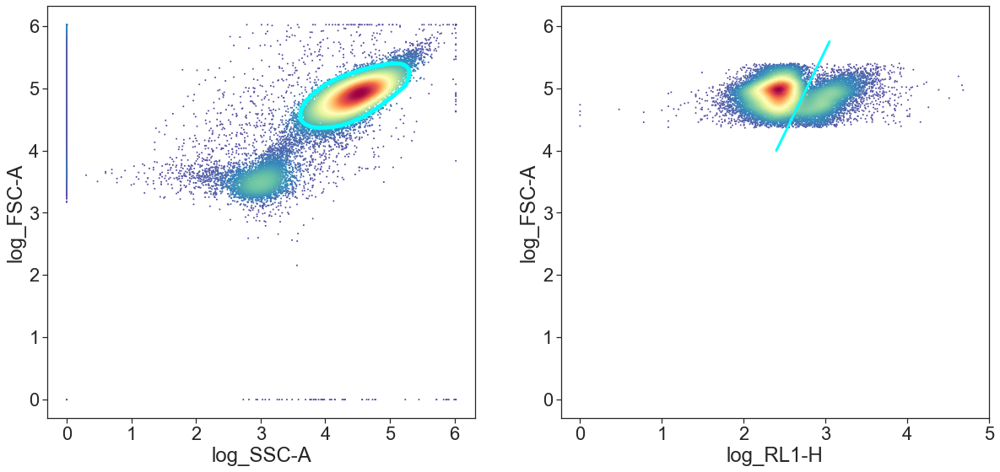

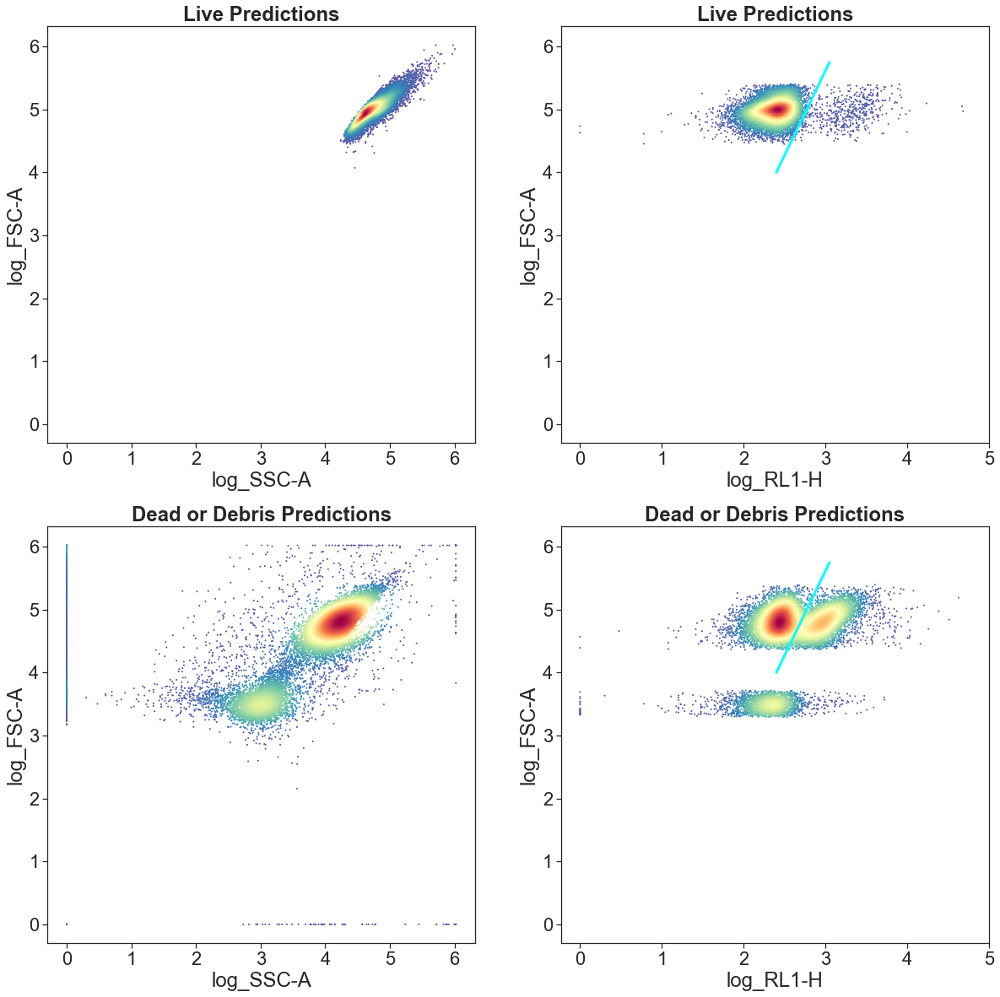

In [355]:
kde_scatter(conc_df_all, logged=True, subset_ratio=0.75, cmap="Spectral_r",
            pred_col="nn_preds", pred_display_type="scatter_density", line_params=([2.4, 3.05], [4, 5.75]))

In [335]:
# kde_scatter(conc_df_all, logged=True, subset_ratio=0.75, cmap="Spectral_r", 
#             pred_col="nn_preds", pred_display_type="alpha_shape")

In [139]:
# conc_df_0 = get_conc_df_with_kde_values(0)
# conc_df_10 = get_conc_df_with_kde_values(10)
# conc_df_15 = get_conc_df_with_kde_values(15)
# conc_df_20 = get_conc_df_with_kde_values(20)
# conc_df_80 = get_conc_df_with_kde_values(80)

In [140]:
# conc_df_all = get_conc_df_with_kde_values("all")

# Standard Options

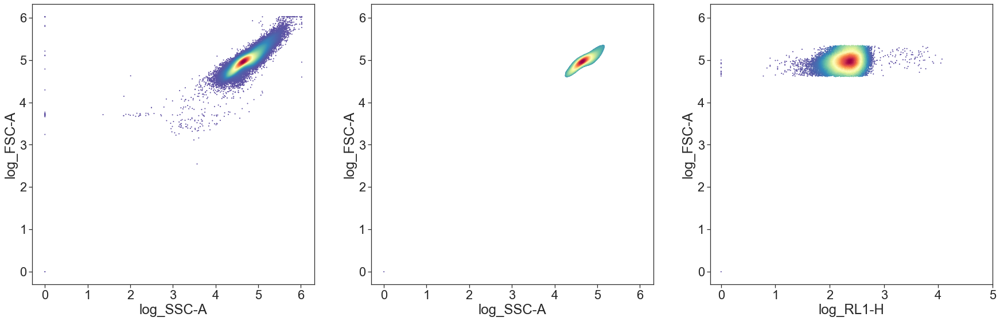

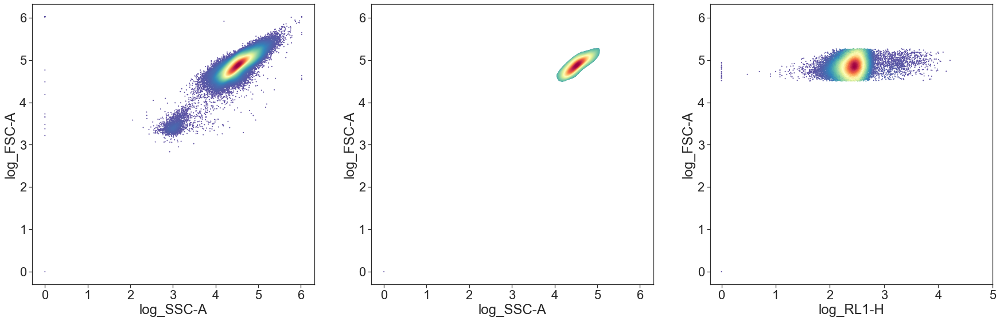

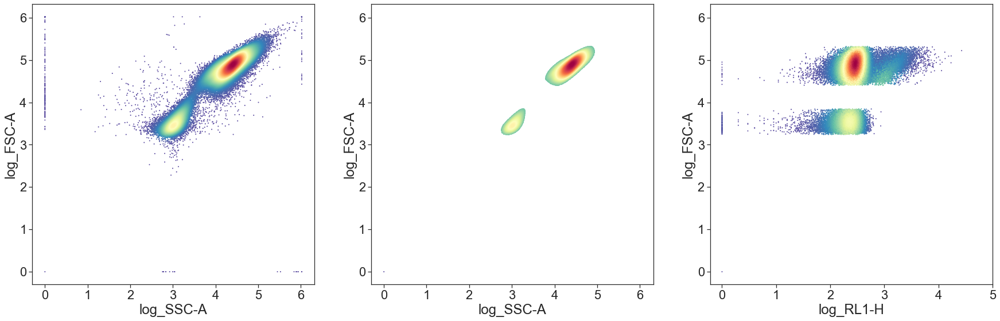

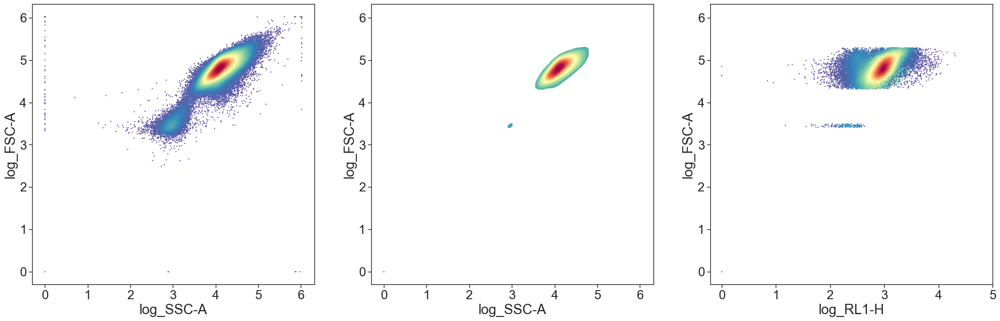

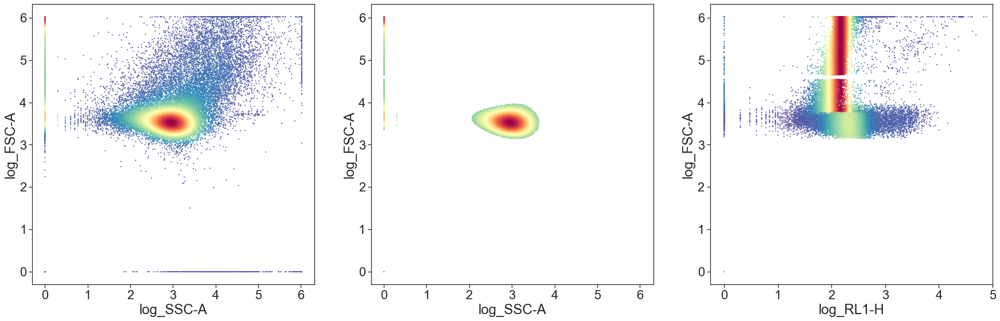

In [289]:
kde_scatter(conc_df_0, logged=True, subset_ratio=0.75, cmap="Spectral_r")
kde_scatter(conc_df_10, logged=True, subset_ratio=0.75, cmap="Spectral_r")
kde_scatter(conc_df_15, logged=True, subset_ratio=0.75, cmap="Spectral_r")
kde_scatter(conc_df_20, logged=True, subset_ratio=0.75, cmap="Spectral_r")
kde_scatter(conc_df_80, logged=True, subset_ratio=0.75, cmap="Spectral_r")

# Binning KDE

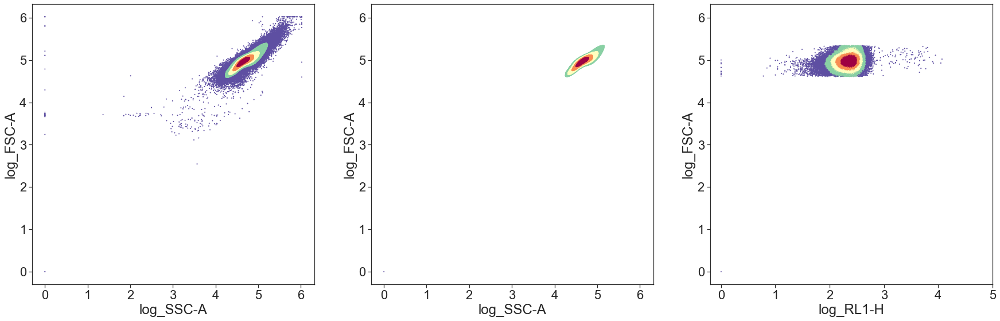

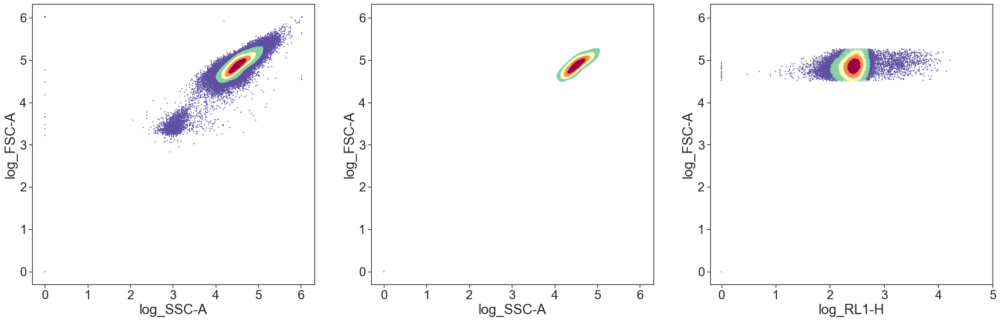

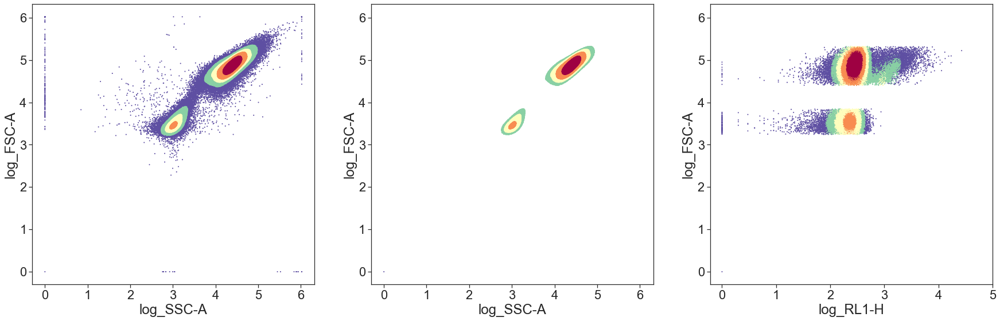

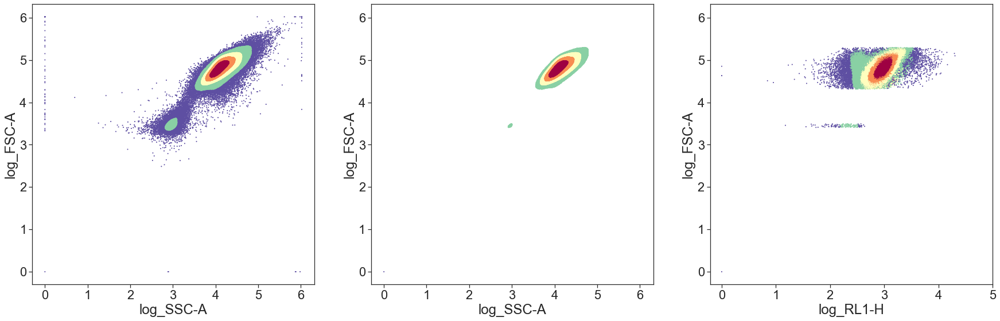

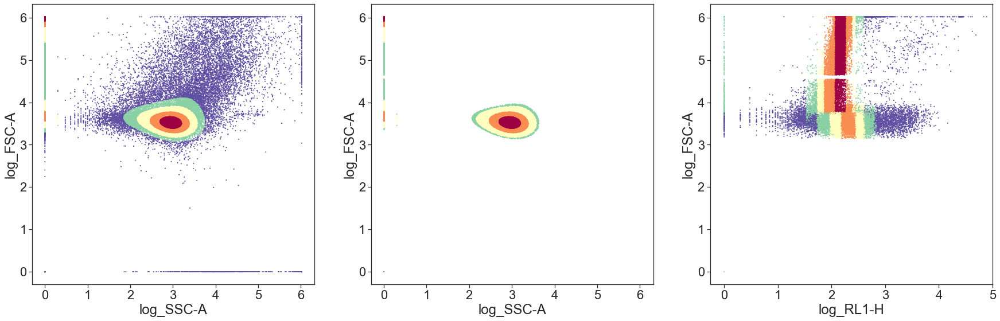

In [290]:
kde_scatter(conc_df_0, logged=True, subset_ratio=0.75, n_bins=5, cmap="Spectral_r")
kde_scatter(conc_df_10, logged=True, subset_ratio=0.75, n_bins=5, cmap="Spectral_r")
kde_scatter(conc_df_15, logged=True, subset_ratio=0.75, n_bins=5, cmap="Spectral_r")
kde_scatter(conc_df_20, logged=True, subset_ratio=0.75, n_bins=5, cmap="Spectral_r")
kde_scatter(conc_df_80, logged=True, subset_ratio=0.75, n_bins=5, cmap="Spectral_r")

# Logging KDE

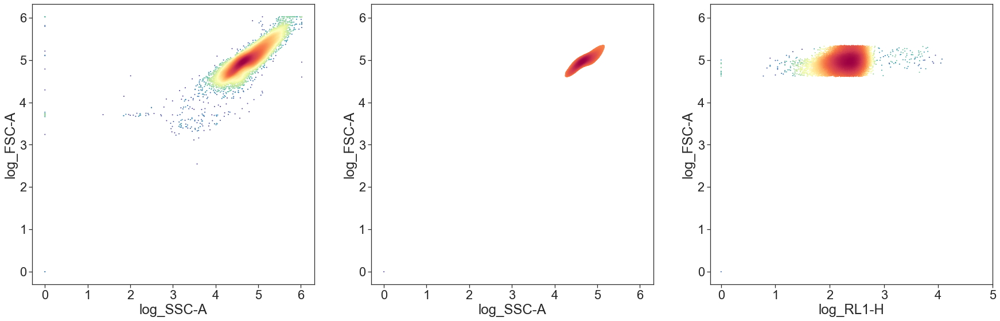

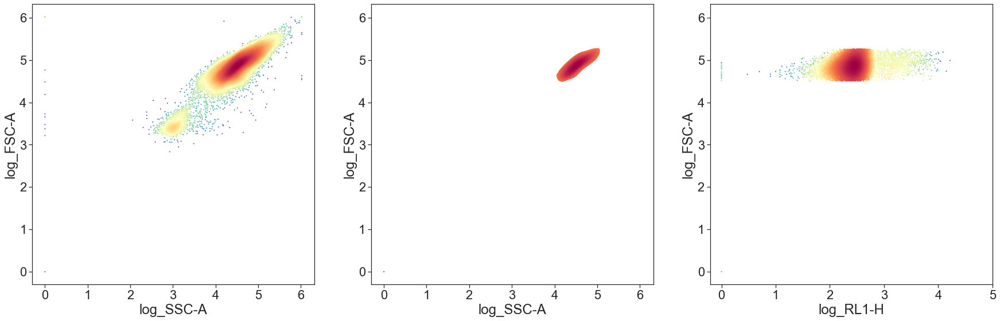

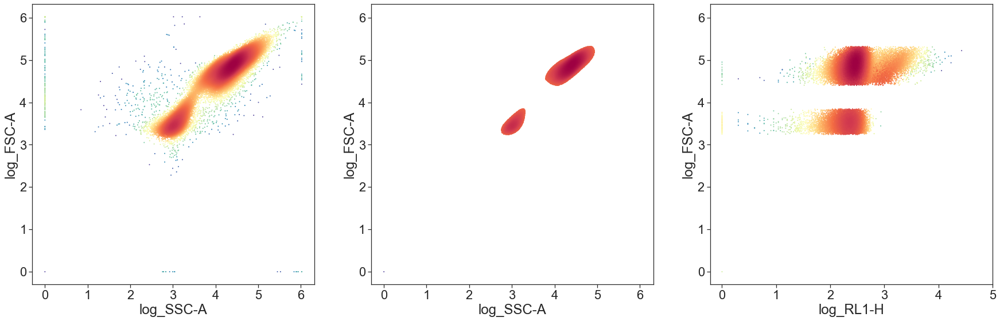

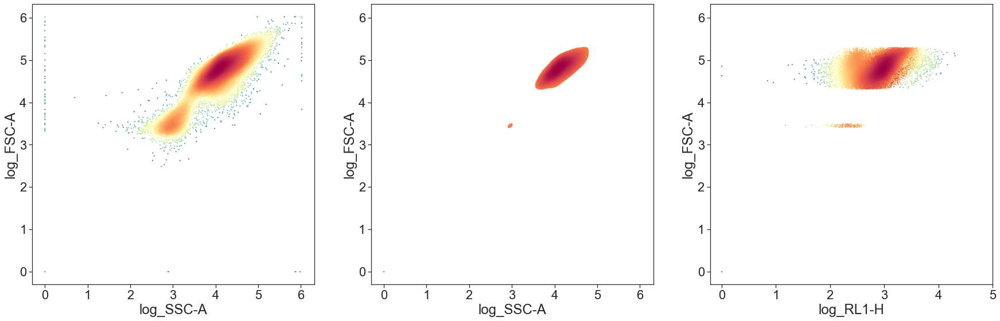

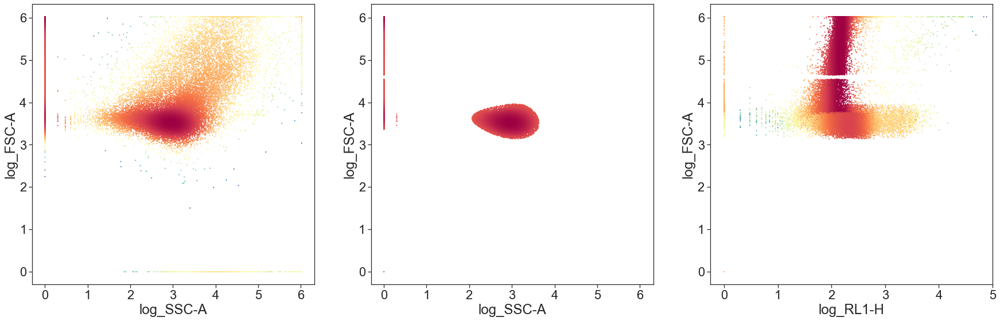

In [291]:
kde_scatter(conc_df_0, logged=True, subset_ratio=0.75, log_kde=True, n_bins=None, cmap="Spectral_r")
kde_scatter(conc_df_10, logged=True, subset_ratio=0.75, log_kde=True, n_bins=None, cmap="Spectral_r")
kde_scatter(conc_df_15, logged=True, subset_ratio=0.75, log_kde=True, n_bins=None, cmap="Spectral_r")
kde_scatter(conc_df_20, logged=True, subset_ratio=0.75, log_kde=True, n_bins=None, cmap="Spectral_r")
kde_scatter(conc_df_80, logged=True, subset_ratio=0.75, log_kde=True, n_bins=None, cmap="Spectral_r")

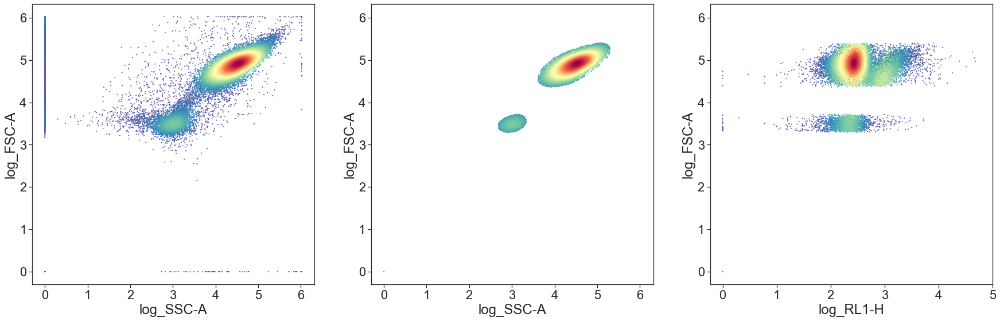

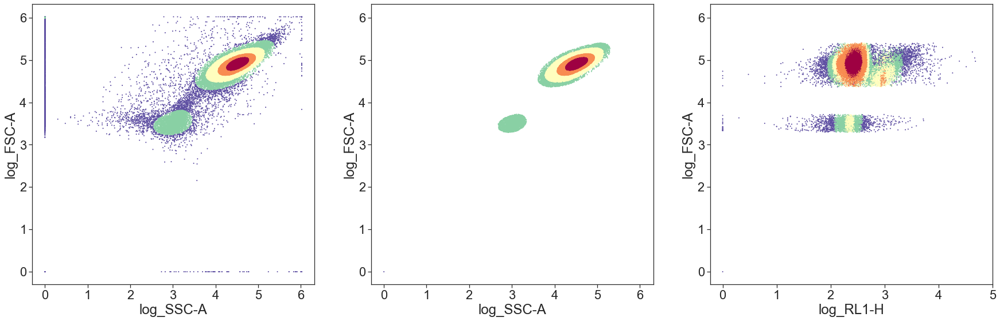

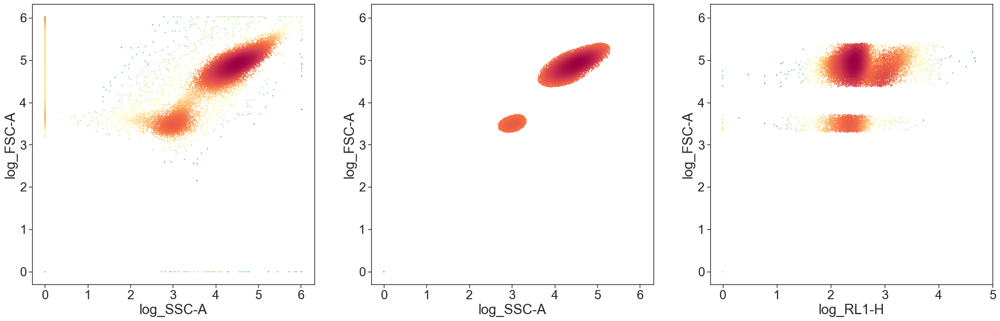

In [292]:
kde_scatter(conc_df_all, logged=True, subset_ratio=0.75, cmap="Spectral_r")
kde_scatter(conc_df_all, logged=True, subset_ratio=0.75, n_bins=5, cmap="Spectral_r")
kde_scatter(conc_df_all, logged=True, subset_ratio=0.75, log_kde=True, n_bins=None, cmap="Spectral_r")

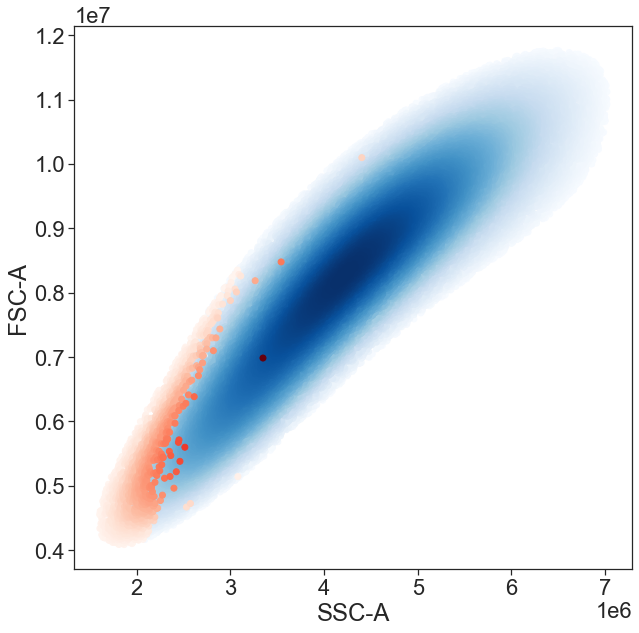

In [207]:
kde_scatter(conc_df, "SSC-A", "FSC-A", "nn_preds", 0.5)